## CIFAR - 10

### Empirical Analysis

Using device: cuda
Num GPUs Available: 1
GPU memory cleared
Files already downloaded and verified
Files already downloaded and verified

Stratified split created:
Training samples: 45000 (4500/class)
Validation samples: 5000 (500/class)
Test samples: 10000

DataLoaders created:
Train batches: 352 | Val batches: 40 | Test batches: 79
Total original batches per epoch: 352
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequent

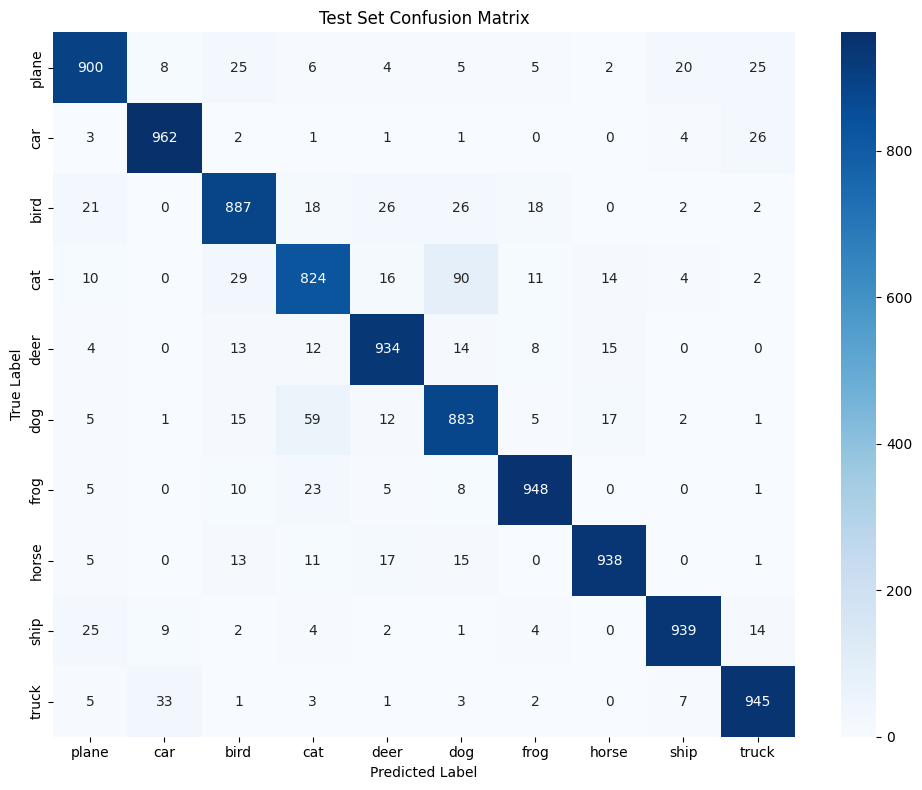

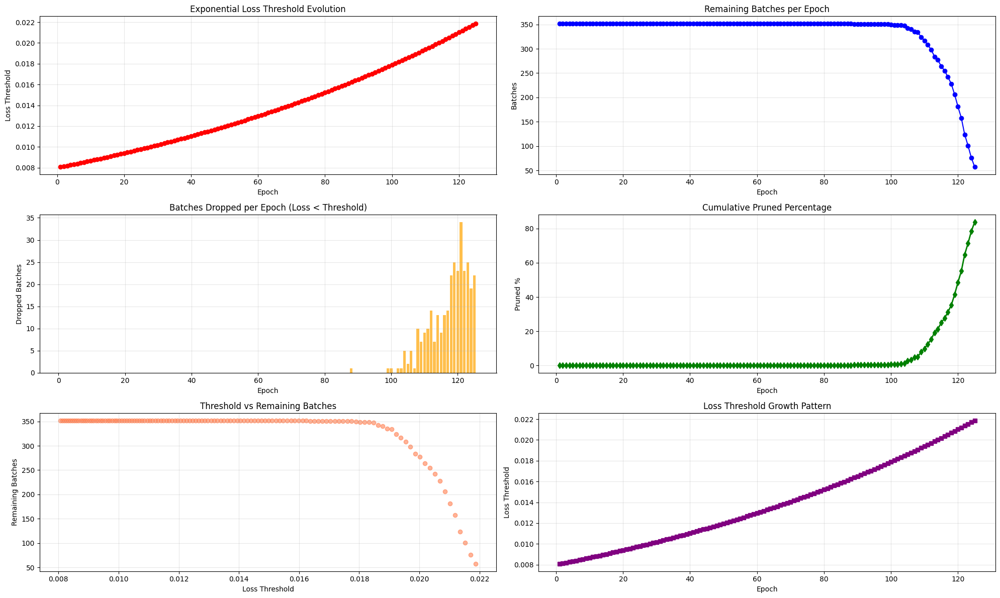

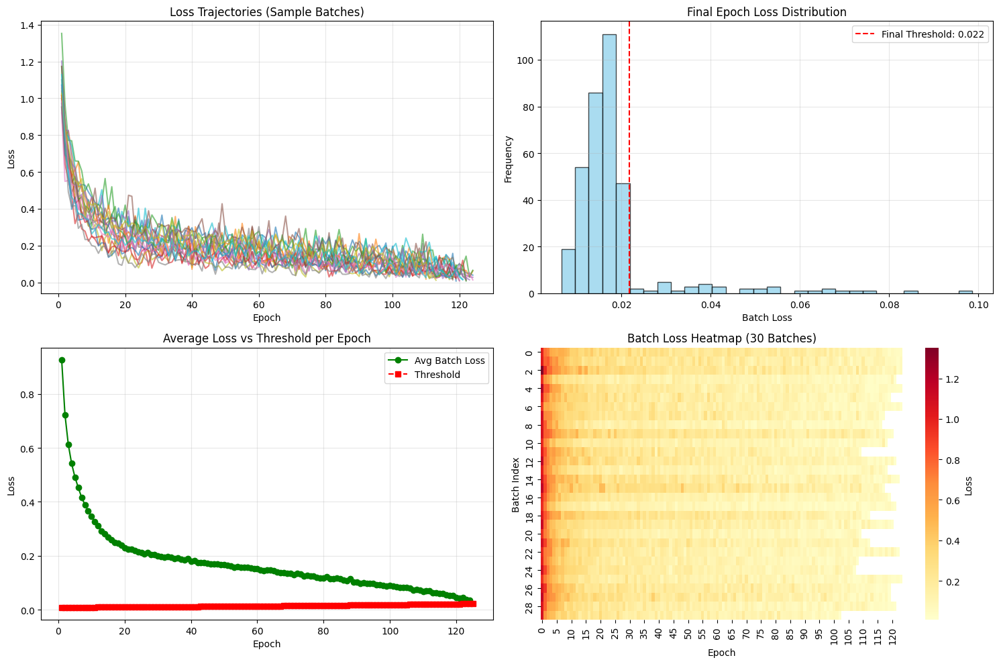

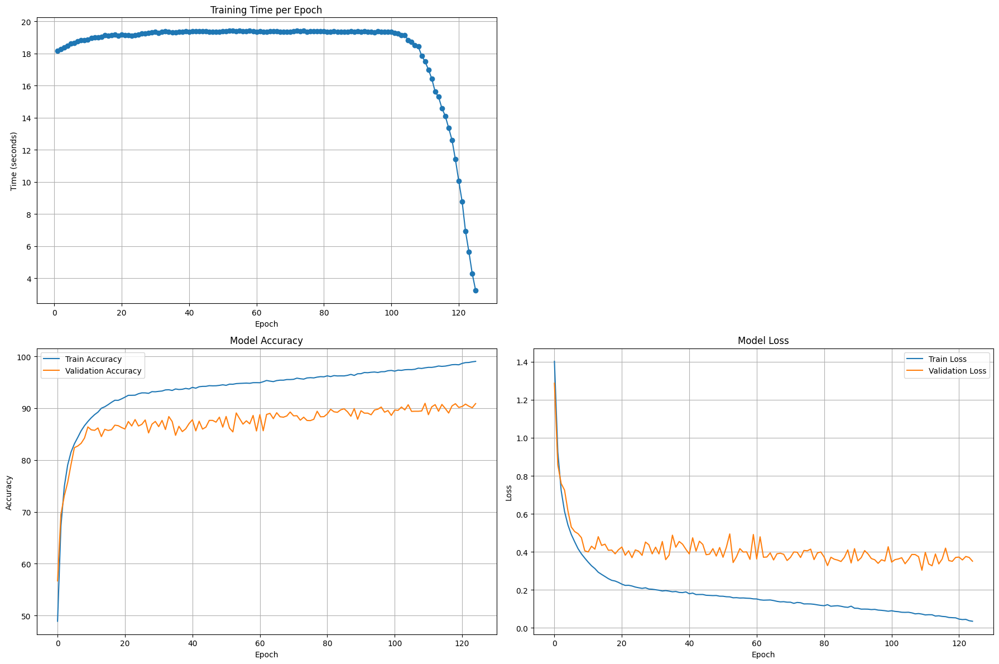


📊 FINAL SUMMARY
Data Utilization Index (DUI): 0.5913
Total epochs: 125
Training time: 2367.14s (39.45 min)
Avg epoch time: 18.24s
Best validation accuracy: 90.94%
Final test accuracy: 91.60%
Batches dropped: 317/352 (90.06%)
FLOPs: 0.56 GFLOPs

✅ Summary saved to loss_based_batch_pruning_summary.csv
✅ Threshold history saved to loss_threshold_history.csv

🎉 Training complete! Final Test Accuracy = 91.60%



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import time
import pandas as pd
from torch.optim.lr_scheduler import CosineAnnealingLR
from thop import profile  # For calculating FLOPs
import math

GLOBAL_TRAIN_BATCH_INDICES = None

# GPU Configuration
def configure_gpu():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if torch.cuda.is_available():
        print(f"Num GPUs Available: {torch.cuda.device_count()}")
        torch.cuda.empty_cache()
        print("GPU memory cleared")

    return device


def load_images(batch_size=128, train_size=45000, val_size=5000, test_size=10000):
    """
    Loads CIFAR-10 with:
      - 45,000 training samples
      - 5,000 validation samples (from original train set)
      - 10,000 test samples (unchanged)
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    full_train_dataset = datasets.CIFAR10(
        root='./data',
        train=True,
        download=True,
        transform=transform_train
    )

    full_test_dataset = datasets.CIFAR10(
        root='./data',
        train=False,
        download=True,
        transform=transform_test
    )

    class_names = ['plane', 'car', 'bird', 'cat', 'deer',
                   'dog', 'frog', 'horse', 'ship', 'truck']

    # Stratified split: 45k train, 5k val (from original 50k train)
    train_targets = np.array(full_train_dataset.targets)
    train_indices = []
    val_indices = []

    samples_per_class_train = train_size // 10  # 4500 per class
    samples_per_class_val = val_size // 10      # 500 per class

    for class_idx in range(10):
        class_indices = np.where(train_targets == class_idx)[0]
        np.random.shuffle(class_indices)
        train_class_indices = class_indices[:samples_per_class_train]
        val_class_indices = class_indices[samples_per_class_train:samples_per_class_train + samples_per_class_val]

        train_indices.extend(train_class_indices.tolist())
        val_indices.extend(val_class_indices.tolist())

    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)

    print(f"\nStratified split created:")
    print(f"Training samples: {len(train_indices)} (4500/class)")
    print(f"Validation samples: {len(val_indices)} (500/class)")
    print(f"Test samples: {test_size}")

    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)
    test_dataset = Subset(full_test_dataset, np.arange(test_size))  # Use first 10k

    # Consistent Batch Handling for Training
    num_samples = len(train_dataset)
    indices = np.arange(num_samples)
    np.random.shuffle(indices)

    batch_indices = [
        indices[i:i + batch_size].tolist()
        for i in range(0, num_samples, batch_size)
    ]

    global GLOBAL_TRAIN_BATCH_INDICES
    GLOBAL_TRAIN_BATCH_INDICES = batch_indices

    class BatchIndexSampler:
        def __init__(self, batch_indices_list, shuffle_within_batch=True):
            self.batch_indices_list = batch_indices_list
            self.shuffle_within_batch = shuffle_within_batch

        def __iter__(self):
            batch_indices = [b.copy() for b in self.batch_indices_list]
            for batch_idx in batch_indices:
                if self.shuffle_within_batch:
                    np.random.shuffle(batch_idx)
                yield from batch_idx

        def __len__(self):
            return sum(len(b) for b in self.batch_indices_list)

    sampler = BatchIndexSampler(batch_indices, shuffle_within_batch=True)

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        sampler=sampler,
        num_workers=4,
        pin_memory=True,
        drop_last=False
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    print(f"\nDataLoaders created:")
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")

    return train_loader, val_loader, test_loader, class_names


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        return out

def ResNet18(num_classes=10):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)


def calculate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nModel Parameters:")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    return total_params, trainable_params


def calculate_flops(model, input_size=(3, 32, 32)):
    device = next(model.parameters()).device
    dummy_input = torch.randn(1, *input_size).to(device)

    try:
        flops, params = profile(model, inputs=(dummy_input,), verbose=False)
        print(f"\nModel Computational Requirements:")
        print(f"FLOPs: {flops:,} ({flops/1e9:.2f} GFLOPs)")
        return flops
    except Exception as e:
        print(f"FLOPs calculation failed: {e}")
        return None


def train_epoch(model, device, train_loader, optimizer, epoch, batch_indices=None, scheduler=None, threshold=0.5):
    model.train()
    train_loss = 0
    correct = 0
    total = 0

    batch_losses = {}
    batch_indices_list = []

    start_time = time.time()
    total_images_processed = 0
    batch_processing_times = []

    global GLOBAL_TRAIN_BATCH_INDICES
    total_logical_batches = len(GLOBAL_TRAIN_BATCH_INDICES)

    active_batch_indices = batch_indices if batch_indices is not None else list(range(total_logical_batches))
    print(f"Using {len(active_batch_indices)} out of {total_logical_batches} batches")

    data_iter = iter(train_loader)

    for logical_batch_idx in active_batch_indices:
        try:
            data, target = next(data_iter)
        except StopIteration:
            break

        batch_start_time = time.time()
        batch_indices_list.append(logical_batch_idx)

        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)

        batch_losses[logical_batch_idx] = loss.item()

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()

        batch_end_time = time.time()
        batch_time = batch_end_time - batch_start_time
        batch_processing_times.append(batch_time)
        total_images_processed += data.size(0)

        if len(batch_indices_list) % 10 == 0:
            print(f'Train Epoch: {epoch} [{total_images_processed}/{len(active_batch_indices) * data.size(0)} '
                  f'({100. * len(batch_indices_list) / len(active_batch_indices):.0f}%)]\t'
                  f'Loss: {loss.item():.6f}\tAccuracy: {100. * correct / total:.2f}%')

    end_time = time.time()
    training_time = end_time - start_time

    loss_df = pd.DataFrame({
        'batch_idx': list(batch_losses.keys()),
        'loss': list(batch_losses.values())
    }).set_index('batch_idx')

    avg_batch_time = np.mean(batch_processing_times) if batch_processing_times else 0
    images_per_second = total_images_processed / training_time if training_time > 0 else 0

    epoch_loss = train_loss / len(batch_indices_list) if batch_indices_list else 0
    epoch_acc = 100. * correct / total if total > 0 else 0

    if scheduler is not None:
        scheduler.step()

    print(f"\nEpoch {epoch} completed in {training_time:.2f} seconds")
    print(f"Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")
    print(f"Throughput: {images_per_second:.2f} images/second, Avg batch time: {avg_batch_time:.4f} s")
    print(f"Current loss threshold: {threshold:.6f}")

    throughput_metrics = {
        'epoch_time': training_time,
        'images_per_second': images_per_second,
        'avg_batch_time': avg_batch_time,
        'total_batches': len(batch_indices_list)
    }

    return epoch_loss, epoch_acc, loss_df, batch_indices_list, throughput_metrics


def validate(model, device, loader, loader_name="Validation"):
    model.eval()
    val_loss = 0
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += F.cross_entropy(output, target).item()
            pred = output.argmax(dim=1)
            correct += pred.eq(target).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    val_loss /= len(loader)
    val_acc = 100. * correct / len(loader.dataset)

    print(f"{loader_name} Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")

    return val_loss, val_acc, all_targets, all_preds


def plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    plt.plot(range(1, len(epoch_times) + 1), epoch_times, marker='o')
    plt.title('Training Time per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_metrics_loss_based_pruning.pdf')
    plt.show()


def plot_confusion_matrix(all_targets, all_preds, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(all_targets, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


def calculate_exponential_threshold(delta_start, delta_end, T, t):
    alpha = math.log(delta_end / delta_start) / T
    threshold = delta_start * math.exp(alpha * t)
    return threshold


def plot_batch_prune_analysis(threshold_history, remaining_batches_history,
                            dropped_per_epoch_history, pruned_percentage_history):
    plt.figure(figsize=(20, 12))

    plt.subplot(3, 2, 1)
    plt.plot(range(1, len(threshold_history) + 1), threshold_history, marker='o', color='red')
    plt.title('Exponential Loss Threshold Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 2)
    plt.plot(range(1, len(remaining_batches_history) + 1), remaining_batches_history, marker='o', color='blue')
    plt.title('Remaining Batches per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 3)
    plt.bar(range(1, len(dropped_per_epoch_history) + 1), dropped_per_epoch_history, color='orange', alpha=0.7)
    plt.title('Batches Dropped per Epoch (Loss < Threshold)')
    plt.xlabel('Epoch')
    plt.ylabel('Dropped Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 4)
    plt.plot(range(1, len(pruned_percentage_history) + 1), pruned_percentage_history,
             marker='d', color='green', linewidth=2)
    plt.title('Cumulative Pruned Percentage')
    plt.xlabel('Epoch')
    plt.ylabel('Pruned %')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 5)
    plt.scatter(threshold_history, remaining_batches_history, alpha=0.6, color='coral')
    plt.title('Threshold vs Remaining Batches')
    plt.xlabel('Loss Threshold')
    plt.ylabel('Remaining Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 6)
    epochs = range(1, len(threshold_history) + 1)
    plt.plot(epochs, threshold_history, marker='s', color='purple', linewidth=2)
    plt.title('Loss Threshold Growth Pattern')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('batch_prune_loss_based_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def plot_batch_loss_analysis(batch_loss_history, threshold_history):
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    sample_batches = list(batch_loss_history.keys())[:20]
    for idx in sample_batches:
        losses = batch_loss_history[idx]
        plt.plot(range(1, len(losses) + 1), losses, alpha=0.6, label=f'Batch {idx}')
    plt.title('Loss Trajectories (Sample Batches)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 2)
    final_losses = [batch_loss_history[i][-1] for i in batch_loss_history if batch_loss_history[i]]
    plt.hist(final_losses, bins=30, alpha=0.7, color='skyblue', edgecolor='k')
    if threshold_history:
        plt.axvline(threshold_history[-1], color='red', linestyle='--', label=f'Final Threshold: {threshold_history[-1]:.3f}')
    plt.title('Final Epoch Loss Distribution')
    plt.xlabel('Batch Loss')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 3)
    if batch_loss_history:
        max_epochs = max(len(l) for l in batch_loss_history.values())
        avg_losses = []
        for e in range(max_epochs):
            epoch_losses = [batch_loss_history[i][e] for i in batch_loss_history if len(batch_loss_history[i]) > e]
            avg_losses.append(np.mean(epoch_losses))
        plt.plot(range(1, len(avg_losses)+1), avg_losses, marker='o', label='Avg Batch Loss', color='green')
        plt.plot(range(1, len(threshold_history)+1), threshold_history, '--', marker='s', label='Threshold', color='red')
        plt.title('Average Loss vs Threshold per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 4)
    if batch_loss_history:
        sorted_batches = sorted(batch_loss_history.keys())[:30]
        max_epochs = max(len(l) for l in batch_loss_history.values())
        loss_matrix = []
        for b in sorted_batches:
            losses = batch_loss_history[b]
            padded = losses + [np.nan] * (max_epochs - len(losses))
            loss_matrix.append(padded[:max_epochs])
        loss_matrix = np.array(loss_matrix)
        sns.heatmap(loss_matrix, cmap='YlOrRd', cbar_kws={'label': 'Loss'})
        plt.title('Batch Loss Heatmap (30 Batches)')
        plt.xlabel('Epoch')
        plt.ylabel('Batch Index')

    plt.tight_layout()
    plt.savefig('batch_loss_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def run_cifar10_classification():
    device = configure_gpu()

    total_epochs = 200
    batch_size = 128
    learning_rate = 0.05
    weight_decay = 5e-4
    momentum = 0.9

    delta_start = 0.008    # Start threshold (prune low-loss easy batches)
    delta_end = 0.04      # End threshold
    min_batch_percentage = 0.1  # Keep at least 10% batches

    # NEW: Load train, val, test splits
    train_loader, val_loader, test_loader, class_names = load_images(
        batch_size=batch_size,
        train_size=45000,
        val_size=5000,
        test_size=10000
    )

    total_original_batches = len(train_loader)
    print(f"Total original batches per epoch: {total_original_batches}")

    model = ResNet18(num_classes=10).to(device)
    print(model)

    total_params, trainable_params = calculate_model_parameters(model)
    flops = calculate_flops(model)

    optimizer = optim.SGD(model.parameters(),
                         lr=learning_rate,
                         momentum=momentum,
                         weight_decay=weight_decay,
                         nesterov=True)
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)

    # History
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epoch_times = []

    # Pruning tracking
    prev_epoch_loss_df = None
    batch_indices_to_use = None
    total_dropped_batches = 0
    total_remaining_batches = []
    total_batches_dropped_per_epoch = []

    threshold_history = []
    pruned_percentage_history = []
    batch_loss_history = {}

    total_training_start = time.time()

    best_val_acc = 0
    best_model_state = None
    patience_counter = 0

    for epoch in range(1, total_epochs + 1):
        print(f"\n{'='*50}")
        print(f"EPOCH {epoch}/{total_epochs}")
        print(f"{'='*50}")

        current_threshold = calculate_exponential_threshold(delta_start, delta_end, total_epochs, epoch)
        threshold_history.append(current_threshold)

        train_loss, train_acc, current_loss_df, used_batch_indices, throughput_metrics = train_epoch(
            model, device, train_loader, optimizer, epoch,
            batch_indices=batch_indices_to_use,
            scheduler=scheduler,
            threshold=current_threshold
        )

        epoch_times.append(throughput_metrics['epoch_time'])
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        current_remaining_batches = len(used_batch_indices) if used_batch_indices is not None else total_original_batches
        total_remaining_batches.append(current_remaining_batches)
        pruned_percent = (1 - current_remaining_batches / total_original_batches) * 100
        pruned_percentage_history.append(pruned_percent)

        # VALIDATE on validation set
        val_loss, val_acc, _, _ = validate(model, device, val_loader, "Validation")
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            torch.save(model.state_dict(), 'best_resnet18_loss_based_pruning.pth')
            patience_counter = 0
            print(f"✓ New best validation accuracy: {best_val_acc:.2f}%")
        else:
            patience_counter += 1

        batches_dropped_this_epoch = 0

        if epoch > 1 and prev_epoch_loss_df is not None:
            common_indices = set(prev_epoch_loss_df.index) & set(current_loss_df.index)
            batches_to_drop = []

            for idx in common_indices:
                curr_loss = current_loss_df.loc[idx, 'loss']
                if idx not in batch_loss_history:
                    batch_loss_history[idx] = []
                batch_loss_history[idx].append(curr_loss)

                if curr_loss < current_threshold:
                    batches_to_drop.append(idx)

            if batches_to_drop:
                total_dropped_batches += len(batches_to_drop)
                batches_dropped_this_epoch = len(batches_to_drop)

            batch_indices_to_use = [i for i in (batch_indices_to_use or range(total_original_batches)) if i not in batches_to_drop]

        prev_epoch_loss_df = current_loss_df
        total_batches_dropped_per_epoch.append(batches_dropped_this_epoch)

        if batch_indices_to_use is not None:
            pct = len(batch_indices_to_use) / total_original_batches * 100
            print(f"Batches remaining: {len(batch_indices_to_use)}/{total_original_batches} ({pct:.2f}%)")
            print(f"Total dropped so far: {total_dropped_batches} ({100 * total_dropped_batches / total_original_batches:.2f}%)")

        if batch_indices_to_use and len(batch_indices_to_use) <= total_original_batches * min_batch_percentage:
            print(f"\n🛑 Early stopping: < {min_batch_percentage*100}% batches remain.")
            break

    # Load best model for final test
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"\nLoaded best model (val acc: {best_val_acc:.2f}%) for final test.")

    # FINAL TEST EVALUATION
    print(f"\n{'='*60}")
    print("🔍 FINAL TEST EVALUATION (on untouched 10k test set)")
    print(f"{'='*60}")
    test_loss, test_acc, test_targets, test_preds = validate(model, device, test_loader, "Test")
    print(f"✅ FINAL TEST ACCURACY: {test_acc:.2f}%")
    print(f"{'='*60}")

    # Confusion matrix for test set
    plot_confusion_matrix(test_targets, test_preds, class_names, "Test Set Confusion Matrix")

    total_training_end = time.time()
    total_training_time = total_training_end - total_training_start
    avg_epoch_time = np.mean(epoch_times) if epoch_times else 0

    total_epochs_completed = len(epoch_times)
    sum_remaining_batches = sum(total_remaining_batches)
    max_batches = total_epochs * total_original_batches
    data_utilization_index = sum_remaining_batches / max_batches if max_batches > 0 else 0

    plot_batch_prune_analysis(threshold_history, total_remaining_batches,
                            total_batches_dropped_per_epoch, pruned_percentage_history)
    plot_batch_loss_analysis(batch_loss_history, threshold_history)
    plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs)

    # Final stats
    percent_dropped = 100 * total_dropped_batches / total_original_batches
    percent_remaining = 100 - percent_dropped

    print(f"\n📊 FINAL SUMMARY")
    print(f"Data Utilization Index (DUI): {data_utilization_index:.4f}")
    print(f"Total epochs: {total_epochs_completed}")
    print(f"Training time: {total_training_time:.2f}s ({total_training_time/60:.2f} min)")
    print(f"Avg epoch time: {avg_epoch_time:.2f}s")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")
    print(f"Final test accuracy: {test_acc:.2f}%")
    print(f"Batches dropped: {total_dropped_batches}/{total_original_batches} ({percent_dropped:.2f}%)")
    if flops:
        print(f"FLOPs: {flops/1e9:.2f} GFLOPs")

    # Save summary
    summary_data = {
        'total_training_time_sec': [total_training_time],
        'average_epoch_time_sec': [avg_epoch_time],
        'epochs_completed': [total_epochs_completed],
        'best_validation_accuracy': [best_val_acc],
        'final_test_accuracy': [test_acc],
        'total_parameters': [total_params],
        'data_utilization_index': [data_utilization_index],
        'total_batches_dropped': [total_dropped_batches],
        'batch_drop_percentage': [percent_dropped],
        'final_threshold': [threshold_history[-1] if threshold_history else delta_start],
        'delta_start': [delta_start],
        'delta_end': [delta_end],
        'learning_rate': [learning_rate],
        'weight_decay': [weight_decay]
    }

    summary_df = pd.DataFrame(summary_data)
    summary_df.to_csv('loss_based_batch_pruning_summary.csv', index=False)
    print("\n✅ Summary saved to loss_based_batch_pruning_summary.csv")

    threshold_df = pd.DataFrame({
        'epoch': range(1, len(threshold_history) + 1),
        'threshold': threshold_history,
        'remaining_batches': total_remaining_batches,
        'batches_dropped': total_batches_dropped_per_epoch,
        'pruned_percentage': pruned_percentage_history
    })
    threshold_df.to_csv('loss_threshold_history.csv', index=False)
    print("✅ Threshold history saved to loss_threshold_history.csv")

    return model, summary_df, test_acc


if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    model, summary_df, test_accuracy = run_cifar10_classification()

    print(f"\n🎉 Training complete! Final Test Accuracy = {test_accuracy:.2f}%\n")

Using device: cuda
Num GPUs Available: 1
GPU memory cleared
Files already downloaded and verified
Files already downloaded and verified

Stratified split created:
Training samples: 45000 (4500/class)
Validation samples: 5000 (500/class)
Test samples: 10000

DataLoaders created:
Train batches: 352 | Val batches: 40 | Test batches: 79
Total original batches per epoch: 352
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequent

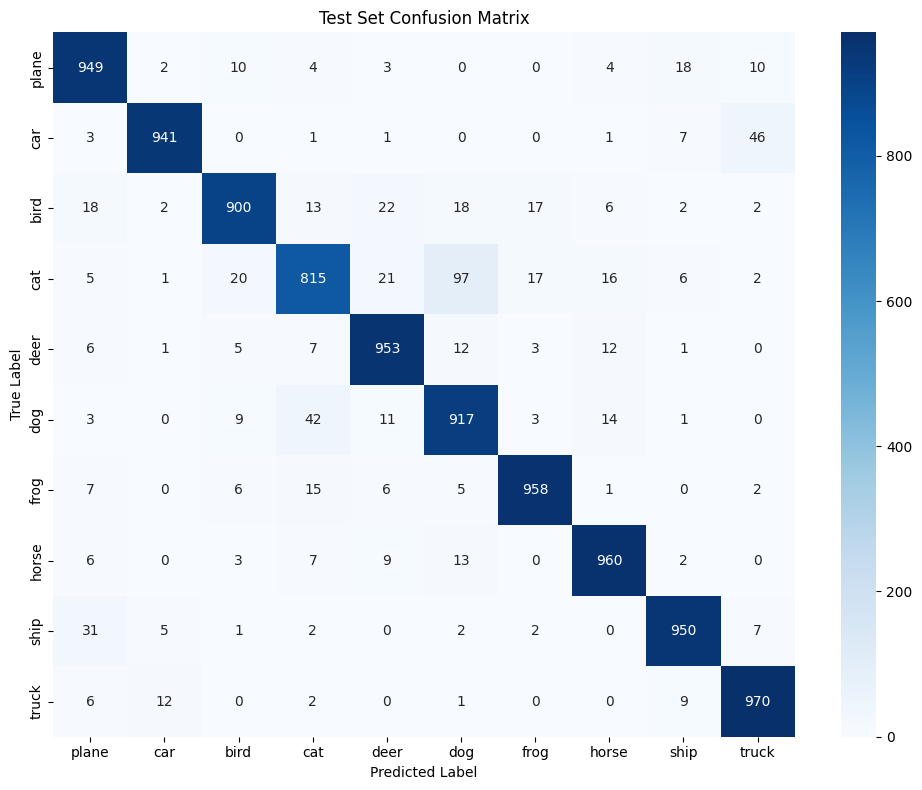

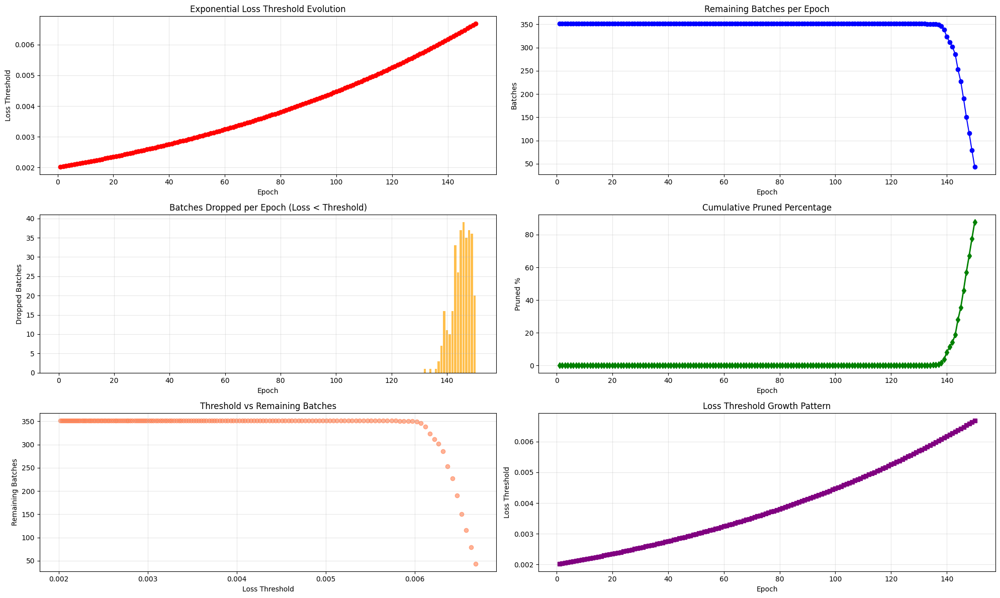

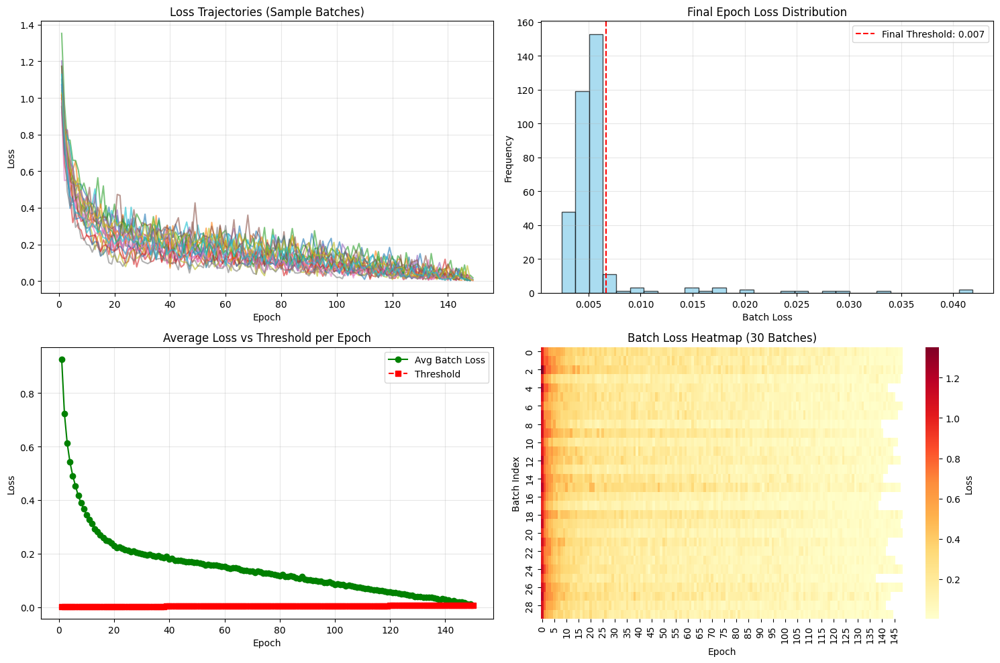

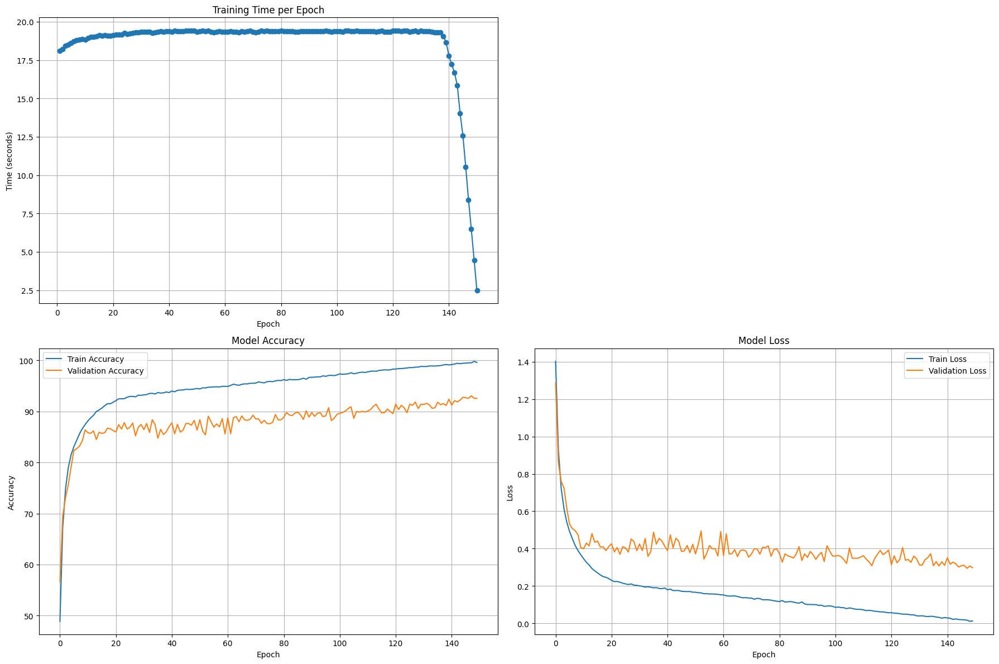


📊 FINAL SUMMARY
Data Utilization Index (DUI): 0.7270
Total epochs: 150
Training time: 2910.71s (48.51 min)
Avg epoch time: 18.70s
Best validation accuracy: 93.06%
Final test accuracy: 93.13%
Batches dropped: 329/352 (93.47%)
FLOPs: 0.56 GFLOPs

✅ Summary saved to loss_based_batch_pruning_summary.csv
✅ Threshold history saved to loss_threshold_history.csv

🎉 Training complete! Final Test Accuracy = 93.13%



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import time
import pandas as pd
from torch.optim.lr_scheduler import CosineAnnealingLR
from thop import profile  # For calculating FLOPs
import math

GLOBAL_TRAIN_BATCH_INDICES = None

# GPU Configuration
def configure_gpu():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if torch.cuda.is_available():
        print(f"Num GPUs Available: {torch.cuda.device_count()}")
        torch.cuda.empty_cache()
        print("GPU memory cleared")

    return device


def load_images(batch_size=128, train_size=45000, val_size=5000, test_size=10000):
    """
    Loads CIFAR-10 with:
      - 45,000 training samples
      - 5,000 validation samples (from original train set)
      - 10,000 test samples (unchanged)
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    full_train_dataset = datasets.CIFAR10(
        root='./data',
        train=True,
        download=True,
        transform=transform_train
    )

    full_test_dataset = datasets.CIFAR10(
        root='./data',
        train=False,
        download=True,
        transform=transform_test
    )

    class_names = ['plane', 'car', 'bird', 'cat', 'deer',
                   'dog', 'frog', 'horse', 'ship', 'truck']

    # Stratified split: 45k train, 5k val (from original 50k train)
    train_targets = np.array(full_train_dataset.targets)
    train_indices = []
    val_indices = []

    samples_per_class_train = train_size // 10  # 4500 per class
    samples_per_class_val = val_size // 10      # 500 per class

    for class_idx in range(10):
        class_indices = np.where(train_targets == class_idx)[0]
        np.random.shuffle(class_indices)
        train_class_indices = class_indices[:samples_per_class_train]
        val_class_indices = class_indices[samples_per_class_train:samples_per_class_train + samples_per_class_val]

        train_indices.extend(train_class_indices.tolist())
        val_indices.extend(val_class_indices.tolist())

    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)

    print(f"\nStratified split created:")
    print(f"Training samples: {len(train_indices)} (4500/class)")
    print(f"Validation samples: {len(val_indices)} (500/class)")
    print(f"Test samples: {test_size}")

    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)
    test_dataset = Subset(full_test_dataset, np.arange(test_size))  # Use first 10k

    # Consistent Batch Handling for Training
    num_samples = len(train_dataset)
    indices = np.arange(num_samples)
    np.random.shuffle(indices)

    batch_indices = [
        indices[i:i + batch_size].tolist()
        for i in range(0, num_samples, batch_size)
    ]

    global GLOBAL_TRAIN_BATCH_INDICES
    GLOBAL_TRAIN_BATCH_INDICES = batch_indices

    class BatchIndexSampler:
        def __init__(self, batch_indices_list, shuffle_within_batch=True):
            self.batch_indices_list = batch_indices_list
            self.shuffle_within_batch = shuffle_within_batch

        def __iter__(self):
            batch_indices = [b.copy() for b in self.batch_indices_list]
            for batch_idx in batch_indices:
                if self.shuffle_within_batch:
                    np.random.shuffle(batch_idx)
                yield from batch_idx

        def __len__(self):
            return sum(len(b) for b in self.batch_indices_list)

    sampler = BatchIndexSampler(batch_indices, shuffle_within_batch=True)

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        sampler=sampler,
        num_workers=4,
        pin_memory=True,
        drop_last=False
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    print(f"\nDataLoaders created:")
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")

    return train_loader, val_loader, test_loader, class_names


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        return out

def ResNet18(num_classes=10):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)


def calculate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nModel Parameters:")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    return total_params, trainable_params


def calculate_flops(model, input_size=(3, 32, 32)):
    device = next(model.parameters()).device
    dummy_input = torch.randn(1, *input_size).to(device)

    try:
        flops, params = profile(model, inputs=(dummy_input,), verbose=False)
        print(f"\nModel Computational Requirements:")
        print(f"FLOPs: {flops:,} ({flops/1e9:.2f} GFLOPs)")
        return flops
    except Exception as e:
        print(f"FLOPs calculation failed: {e}")
        return None


def train_epoch(model, device, train_loader, optimizer, epoch, batch_indices=None, scheduler=None, threshold=0.5):
    model.train()
    train_loss = 0
    correct = 0
    total = 0

    batch_losses = {}
    batch_indices_list = []

    start_time = time.time()
    total_images_processed = 0
    batch_processing_times = []

    global GLOBAL_TRAIN_BATCH_INDICES
    total_logical_batches = len(GLOBAL_TRAIN_BATCH_INDICES)

    active_batch_indices = batch_indices if batch_indices is not None else list(range(total_logical_batches))
    print(f"Using {len(active_batch_indices)} out of {total_logical_batches} batches")

    data_iter = iter(train_loader)

    for logical_batch_idx in active_batch_indices:
        try:
            data, target = next(data_iter)
        except StopIteration:
            break

        batch_start_time = time.time()
        batch_indices_list.append(logical_batch_idx)

        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)

        batch_losses[logical_batch_idx] = loss.item()

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()

        batch_end_time = time.time()
        batch_time = batch_end_time - batch_start_time
        batch_processing_times.append(batch_time)
        total_images_processed += data.size(0)

        if len(batch_indices_list) % 10 == 0:
            print(f'Train Epoch: {epoch} [{total_images_processed}/{len(active_batch_indices) * data.size(0)} '
                  f'({100. * len(batch_indices_list) / len(active_batch_indices):.0f}%)]\t'
                  f'Loss: {loss.item():.6f}\tAccuracy: {100. * correct / total:.2f}%')

    end_time = time.time()
    training_time = end_time - start_time

    loss_df = pd.DataFrame({
        'batch_idx': list(batch_losses.keys()),
        'loss': list(batch_losses.values())
    }).set_index('batch_idx')

    avg_batch_time = np.mean(batch_processing_times) if batch_processing_times else 0
    images_per_second = total_images_processed / training_time if training_time > 0 else 0

    epoch_loss = train_loss / len(batch_indices_list) if batch_indices_list else 0
    epoch_acc = 100. * correct / total if total > 0 else 0

    if scheduler is not None:
        scheduler.step()

    print(f"\nEpoch {epoch} completed in {training_time:.2f} seconds")
    print(f"Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")
    print(f"Throughput: {images_per_second:.2f} images/second, Avg batch time: {avg_batch_time:.4f} s")
    print(f"Current loss threshold: {threshold:.6f}")

    throughput_metrics = {
        'epoch_time': training_time,
        'images_per_second': images_per_second,
        'avg_batch_time': avg_batch_time,
        'total_batches': len(batch_indices_list)
    }

    return epoch_loss, epoch_acc, loss_df, batch_indices_list, throughput_metrics


def validate(model, device, loader, loader_name="Validation"):
    model.eval()
    val_loss = 0
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += F.cross_entropy(output, target).item()
            pred = output.argmax(dim=1)
            correct += pred.eq(target).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    val_loss /= len(loader)
    val_acc = 100. * correct / len(loader.dataset)

    print(f"{loader_name} Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")

    return val_loss, val_acc, all_targets, all_preds


def plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    plt.plot(range(1, len(epoch_times) + 1), epoch_times, marker='o')
    plt.title('Training Time per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_metrics_loss_based_pruning.pdf')
    plt.show()


def plot_confusion_matrix(all_targets, all_preds, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(all_targets, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


def calculate_exponential_threshold(delta_start, delta_end, T, t):
    alpha = math.log(delta_end / delta_start) / T
    threshold = delta_start * math.exp(alpha * t)
    return threshold


def plot_batch_prune_analysis(threshold_history, remaining_batches_history,
                            dropped_per_epoch_history, pruned_percentage_history):
    plt.figure(figsize=(20, 12))

    plt.subplot(3, 2, 1)
    plt.plot(range(1, len(threshold_history) + 1), threshold_history, marker='o', color='red')
    plt.title('Exponential Loss Threshold Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 2)
    plt.plot(range(1, len(remaining_batches_history) + 1), remaining_batches_history, marker='o', color='blue')
    plt.title('Remaining Batches per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 3)
    plt.bar(range(1, len(dropped_per_epoch_history) + 1), dropped_per_epoch_history, color='orange', alpha=0.7)
    plt.title('Batches Dropped per Epoch (Loss < Threshold)')
    plt.xlabel('Epoch')
    plt.ylabel('Dropped Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 4)
    plt.plot(range(1, len(pruned_percentage_history) + 1), pruned_percentage_history,
             marker='d', color='green', linewidth=2)
    plt.title('Cumulative Pruned Percentage')
    plt.xlabel('Epoch')
    plt.ylabel('Pruned %')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 5)
    plt.scatter(threshold_history, remaining_batches_history, alpha=0.6, color='coral')
    plt.title('Threshold vs Remaining Batches')
    plt.xlabel('Loss Threshold')
    plt.ylabel('Remaining Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 6)
    epochs = range(1, len(threshold_history) + 1)
    plt.plot(epochs, threshold_history, marker='s', color='purple', linewidth=2)
    plt.title('Loss Threshold Growth Pattern')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('batch_prune_loss_based_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def plot_batch_loss_analysis(batch_loss_history, threshold_history):
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    sample_batches = list(batch_loss_history.keys())[:20]
    for idx in sample_batches:
        losses = batch_loss_history[idx]
        plt.plot(range(1, len(losses) + 1), losses, alpha=0.6, label=f'Batch {idx}')
    plt.title('Loss Trajectories (Sample Batches)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 2)
    final_losses = [batch_loss_history[i][-1] for i in batch_loss_history if batch_loss_history[i]]
    plt.hist(final_losses, bins=30, alpha=0.7, color='skyblue', edgecolor='k')
    if threshold_history:
        plt.axvline(threshold_history[-1], color='red', linestyle='--', label=f'Final Threshold: {threshold_history[-1]:.3f}')
    plt.title('Final Epoch Loss Distribution')
    plt.xlabel('Batch Loss')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 3)
    if batch_loss_history:
        max_epochs = max(len(l) for l in batch_loss_history.values())
        avg_losses = []
        for e in range(max_epochs):
            epoch_losses = [batch_loss_history[i][e] for i in batch_loss_history if len(batch_loss_history[i]) > e]
            avg_losses.append(np.mean(epoch_losses))
        plt.plot(range(1, len(avg_losses)+1), avg_losses, marker='o', label='Avg Batch Loss', color='green')
        plt.plot(range(1, len(threshold_history)+1), threshold_history, '--', marker='s', label='Threshold', color='red')
        plt.title('Average Loss vs Threshold per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 4)
    if batch_loss_history:
        sorted_batches = sorted(batch_loss_history.keys())[:30]
        max_epochs = max(len(l) for l in batch_loss_history.values())
        loss_matrix = []
        for b in sorted_batches:
            losses = batch_loss_history[b]
            padded = losses + [np.nan] * (max_epochs - len(losses))
            loss_matrix.append(padded[:max_epochs])
        loss_matrix = np.array(loss_matrix)
        sns.heatmap(loss_matrix, cmap='YlOrRd', cbar_kws={'label': 'Loss'})
        plt.title('Batch Loss Heatmap (30 Batches)')
        plt.xlabel('Epoch')
        plt.ylabel('Batch Index')

    plt.tight_layout()
    plt.savefig('batch_loss_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def run_cifar10_classification():
    device = configure_gpu()

    total_epochs = 200
    batch_size = 128
    learning_rate = 0.05
    weight_decay = 5e-4
    momentum = 0.9


    delta_start = 0.002    # Start threshold (prune low-loss easy batches) 0.008
    delta_end = 0.01      # End threshold 0.04
    min_batch_percentage = 0.1  # Keep at least 10% batches

    # NEW: Load train, val, test splits
    train_loader, val_loader, test_loader, class_names = load_images(
        batch_size=batch_size,
        train_size=45000,
        val_size=5000,
        test_size=10000
    )

    total_original_batches = len(train_loader)
    print(f"Total original batches per epoch: {total_original_batches}")

    model = ResNet18(num_classes=10).to(device)
    print(model)

    total_params, trainable_params = calculate_model_parameters(model)
    flops = calculate_flops(model)

    optimizer = optim.SGD(model.parameters(),
                         lr=learning_rate,
                         momentum=momentum,
                         weight_decay=weight_decay,
                         nesterov=True)
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)

    # History
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epoch_times = []

    # Pruning tracking
    prev_epoch_loss_df = None
    batch_indices_to_use = None
    total_dropped_batches = 0
    total_remaining_batches = []
    total_batches_dropped_per_epoch = []

    threshold_history = []
    pruned_percentage_history = []
    batch_loss_history = {}

    total_training_start = time.time()

    best_val_acc = 0
    best_model_state = None
    patience_counter = 0

    for epoch in range(1, total_epochs + 1):
        print(f"\n{'='*50}")
        print(f"EPOCH {epoch}/{total_epochs}")
        print(f"{'='*50}")

        current_threshold = calculate_exponential_threshold(delta_start, delta_end, total_epochs, epoch)
        threshold_history.append(current_threshold)

        train_loss, train_acc, current_loss_df, used_batch_indices, throughput_metrics = train_epoch(
            model, device, train_loader, optimizer, epoch,
            batch_indices=batch_indices_to_use,
            scheduler=scheduler,
            threshold=current_threshold
        )

        epoch_times.append(throughput_metrics['epoch_time'])
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        current_remaining_batches = len(used_batch_indices) if used_batch_indices is not None else total_original_batches
        total_remaining_batches.append(current_remaining_batches)
        pruned_percent = (1 - current_remaining_batches / total_original_batches) * 100
        pruned_percentage_history.append(pruned_percent)

        # VALIDATE on validation set
        val_loss, val_acc, _, _ = validate(model, device, val_loader, "Validation")
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            torch.save(model.state_dict(), 'best_resnet18_loss_based_pruning.pth')
            patience_counter = 0
            print(f"✓ New best validation accuracy: {best_val_acc:.2f}%")
        else:
            patience_counter += 1

        batches_dropped_this_epoch = 0

        if epoch > 1 and prev_epoch_loss_df is not None:
            common_indices = set(prev_epoch_loss_df.index) & set(current_loss_df.index)
            batches_to_drop = []

            for idx in common_indices:
                curr_loss = current_loss_df.loc[idx, 'loss']
                if idx not in batch_loss_history:
                    batch_loss_history[idx] = []
                batch_loss_history[idx].append(curr_loss)

                if curr_loss < current_threshold:
                    batches_to_drop.append(idx)

            if batches_to_drop:
                total_dropped_batches += len(batches_to_drop)
                batches_dropped_this_epoch = len(batches_to_drop)

            batch_indices_to_use = [i for i in (batch_indices_to_use or range(total_original_batches)) if i not in batches_to_drop]

        prev_epoch_loss_df = current_loss_df
        total_batches_dropped_per_epoch.append(batches_dropped_this_epoch)

        if batch_indices_to_use is not None:
            pct = len(batch_indices_to_use) / total_original_batches * 100
            print(f"Batches remaining: {len(batch_indices_to_use)}/{total_original_batches} ({pct:.2f}%)")
            print(f"Total dropped so far: {total_dropped_batches} ({100 * total_dropped_batches / total_original_batches:.2f}%)")

        if batch_indices_to_use and len(batch_indices_to_use) <= total_original_batches * min_batch_percentage:
            print(f"\n🛑 Early stopping: < {min_batch_percentage*100}% batches remain.")
            break

    # Load best model for final test
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"\nLoaded best model (val acc: {best_val_acc:.2f}%) for final test.")

    # FINAL TEST EVALUATION
    print(f"\n{'='*60}")
    print("🔍 FINAL TEST EVALUATION (on untouched 10k test set)")
    print(f"{'='*60}")
    test_loss, test_acc, test_targets, test_preds = validate(model, device, test_loader, "Test")
    print(f"✅ FINAL TEST ACCURACY: {test_acc:.2f}%")
    print(f"{'='*60}")

    # Confusion matrix for test set
    plot_confusion_matrix(test_targets, test_preds, class_names, "Test Set Confusion Matrix")

    total_training_end = time.time()
    total_training_time = total_training_end - total_training_start
    avg_epoch_time = np.mean(epoch_times) if epoch_times else 0

    total_epochs_completed = len(epoch_times)
    sum_remaining_batches = sum(total_remaining_batches)
    max_batches = total_epochs * total_original_batches
    data_utilization_index = sum_remaining_batches / max_batches if max_batches > 0 else 0

    plot_batch_prune_analysis(threshold_history, total_remaining_batches,
                            total_batches_dropped_per_epoch, pruned_percentage_history)
    plot_batch_loss_analysis(batch_loss_history, threshold_history)
    plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs)

    # Final stats
    percent_dropped = 100 * total_dropped_batches / total_original_batches
    percent_remaining = 100 - percent_dropped

    print(f"\n📊 FINAL SUMMARY")
    print(f"Data Utilization Index (DUI): {data_utilization_index:.4f}")
    print(f"Total epochs: {total_epochs_completed}")
    print(f"Training time: {total_training_time:.2f}s ({total_training_time/60:.2f} min)")
    print(f"Avg epoch time: {avg_epoch_time:.2f}s")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")
    print(f"Final test accuracy: {test_acc:.2f}%")
    print(f"Batches dropped: {total_dropped_batches}/{total_original_batches} ({percent_dropped:.2f}%)")
    if flops:
        print(f"FLOPs: {flops/1e9:.2f} GFLOPs")

    # Save summary
    summary_data = {
        'total_training_time_sec': [total_training_time],
        'average_epoch_time_sec': [avg_epoch_time],
        'epochs_completed': [total_epochs_completed],
        'best_validation_accuracy': [best_val_acc],
        'final_test_accuracy': [test_acc],
        'total_parameters': [total_params],
        'data_utilization_index': [data_utilization_index],
        'total_batches_dropped': [total_dropped_batches],
        'batch_drop_percentage': [percent_dropped],
        'final_threshold': [threshold_history[-1] if threshold_history else delta_start],
        'delta_start': [delta_start],
        'delta_end': [delta_end],
        'learning_rate': [learning_rate],
        'weight_decay': [weight_decay]
    }

    summary_df = pd.DataFrame(summary_data)
    summary_df.to_csv('loss_based_batch_pruning_summary.csv', index=False)
    print("\n✅ Summary saved to loss_based_batch_pruning_summary.csv")

    threshold_df = pd.DataFrame({
        'epoch': range(1, len(threshold_history) + 1),
        'threshold': threshold_history,
        'remaining_batches': total_remaining_batches,
        'batches_dropped': total_batches_dropped_per_epoch,
        'pruned_percentage': pruned_percentage_history
    })
    threshold_df.to_csv('loss_threshold_history.csv', index=False)
    print("✅ Threshold history saved to loss_threshold_history.csv")

    return model, summary_df, test_acc


if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    model, summary_df, test_accuracy = run_cifar10_classification()

    print(f"\n🎉 Training complete! Final Test Accuracy = {test_accuracy:.2f}%\n")

Using device: cuda
Num GPUs Available: 1
GPU memory cleared
Files already downloaded and verified
Files already downloaded and verified

Stratified split created:
Training samples: 45000 (4500/class)
Validation samples: 5000 (500/class)
Test samples: 10000

DataLoaders created:
Train batches: 352 | Val batches: 40 | Test batches: 79
Total original batches per epoch: 352
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequent

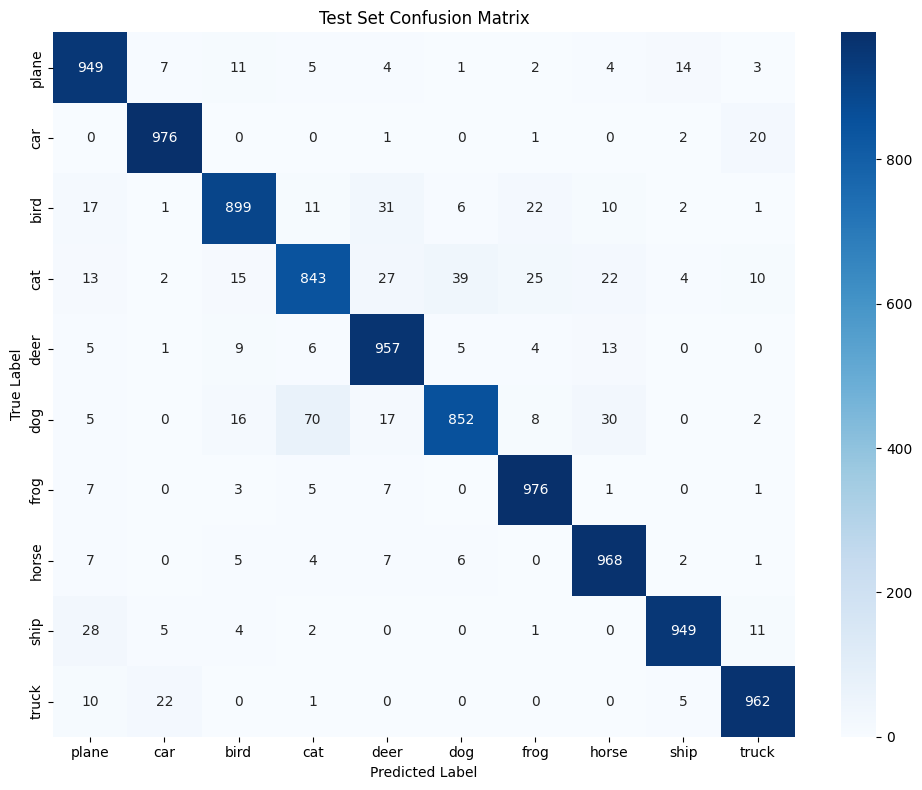

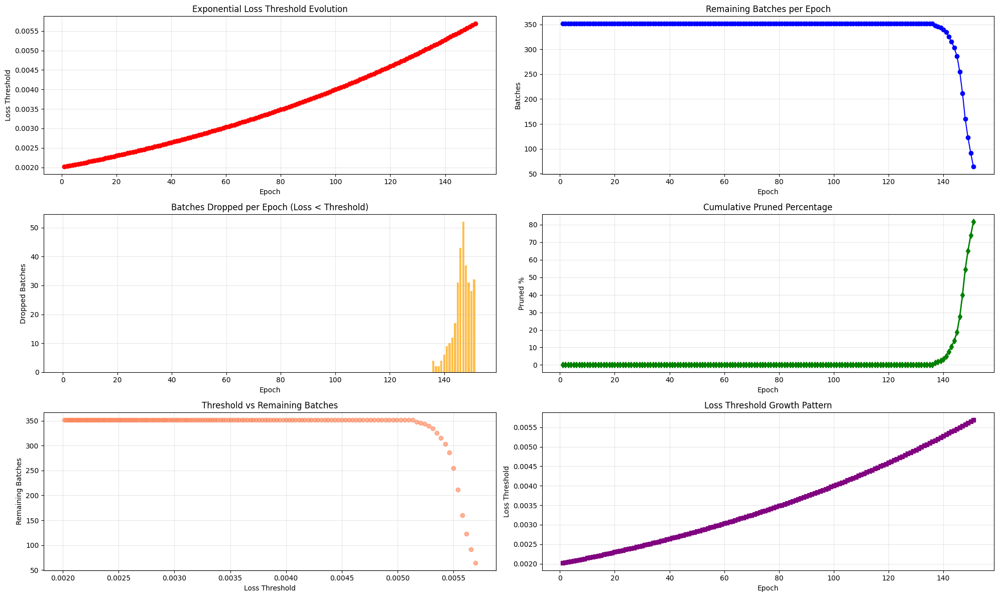

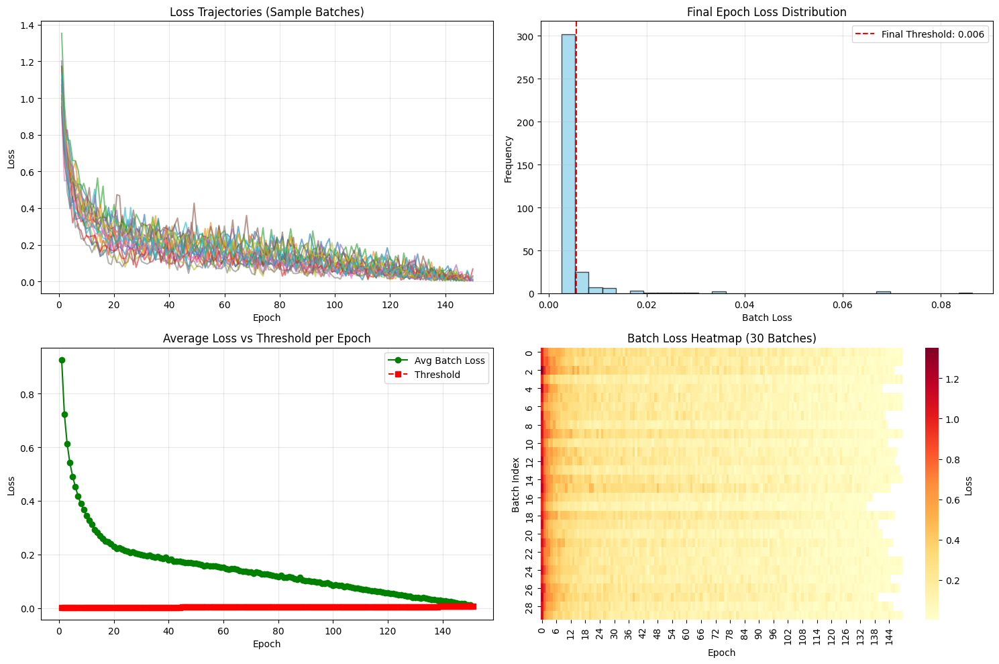

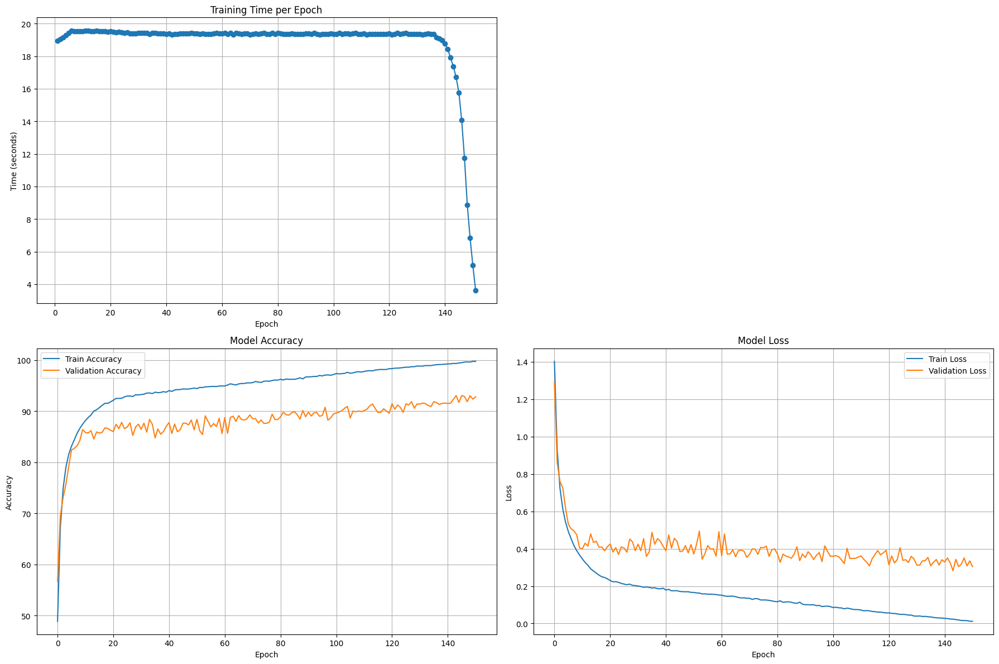


📊 FINAL SUMMARY
Data Utilization Index (DUI): 0.7346
Total epochs: 151
Training time: 2955.96s (49.27 min)
Avg epoch time: 18.88s
Best validation accuracy: 93.04%
Final test accuracy: 93.31%
Batches dropped: 320/352 (90.91%)
FLOPs: 0.56 GFLOPs

✅ Summary saved to loss_based_batch_pruning_summary.csv
✅ Threshold history saved to loss_threshold_history.csv

🎉 Training complete! Final Test Accuracy = 93.31%



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import time
import pandas as pd
from torch.optim.lr_scheduler import CosineAnnealingLR
from thop import profile  # For calculating FLOPs
import math

GLOBAL_TRAIN_BATCH_INDICES = None

# GPU Configuration
def configure_gpu():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if torch.cuda.is_available():
        print(f"Num GPUs Available: {torch.cuda.device_count()}")
        torch.cuda.empty_cache()
        print("GPU memory cleared")

    return device


def load_images(batch_size=128, train_size=45000, val_size=5000, test_size=10000):
    """
    Loads CIFAR-10 with:
      - 45,000 training samples
      - 5,000 validation samples (from original train set)
      - 10,000 test samples (unchanged)
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    full_train_dataset = datasets.CIFAR10(
        root='./data',
        train=True,
        download=True,
        transform=transform_train
    )

    full_test_dataset = datasets.CIFAR10(
        root='./data',
        train=False,
        download=True,
        transform=transform_test
    )

    class_names = ['plane', 'car', 'bird', 'cat', 'deer',
                   'dog', 'frog', 'horse', 'ship', 'truck']

    # Stratified split: 45k train, 5k val (from original 50k train)
    train_targets = np.array(full_train_dataset.targets)
    train_indices = []
    val_indices = []

    samples_per_class_train = train_size // 10  # 4500 per class
    samples_per_class_val = val_size // 10      # 500 per class

    for class_idx in range(10):
        class_indices = np.where(train_targets == class_idx)[0]
        np.random.shuffle(class_indices)
        train_class_indices = class_indices[:samples_per_class_train]
        val_class_indices = class_indices[samples_per_class_train:samples_per_class_train + samples_per_class_val]

        train_indices.extend(train_class_indices.tolist())
        val_indices.extend(val_class_indices.tolist())

    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)

    print(f"\nStratified split created:")
    print(f"Training samples: {len(train_indices)} (4500/class)")
    print(f"Validation samples: {len(val_indices)} (500/class)")
    print(f"Test samples: {test_size}")

    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)
    test_dataset = Subset(full_test_dataset, np.arange(test_size))  # Use first 10k

    # Consistent Batch Handling for Training
    num_samples = len(train_dataset)
    indices = np.arange(num_samples)
    np.random.shuffle(indices)

    batch_indices = [
        indices[i:i + batch_size].tolist()
        for i in range(0, num_samples, batch_size)
    ]

    global GLOBAL_TRAIN_BATCH_INDICES
    GLOBAL_TRAIN_BATCH_INDICES = batch_indices

    class BatchIndexSampler:
        def __init__(self, batch_indices_list, shuffle_within_batch=True):
            self.batch_indices_list = batch_indices_list
            self.shuffle_within_batch = shuffle_within_batch

        def __iter__(self):
            batch_indices = [b.copy() for b in self.batch_indices_list]
            for batch_idx in batch_indices:
                if self.shuffle_within_batch:
                    np.random.shuffle(batch_idx)
                yield from batch_idx

        def __len__(self):
            return sum(len(b) for b in self.batch_indices_list)

    sampler = BatchIndexSampler(batch_indices, shuffle_within_batch=True)

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        sampler=sampler,
        num_workers=4,
        pin_memory=True,
        drop_last=False
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    print(f"\nDataLoaders created:")
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")

    return train_loader, val_loader, test_loader, class_names


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        return out

def ResNet18(num_classes=10):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)


def calculate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nModel Parameters:")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    return total_params, trainable_params


def calculate_flops(model, input_size=(3, 32, 32)):
    device = next(model.parameters()).device
    dummy_input = torch.randn(1, *input_size).to(device)

    try:
        flops, params = profile(model, inputs=(dummy_input,), verbose=False)
        print(f"\nModel Computational Requirements:")
        print(f"FLOPs: {flops:,} ({flops/1e9:.2f} GFLOPs)")
        return flops
    except Exception as e:
        print(f"FLOPs calculation failed: {e}")
        return None


def train_epoch(model, device, train_loader, optimizer, epoch, batch_indices=None, scheduler=None, threshold=0.5):
    model.train()
    train_loss = 0
    correct = 0
    total = 0

    batch_losses = {}
    batch_indices_list = []

    start_time = time.time()
    total_images_processed = 0
    batch_processing_times = []

    global GLOBAL_TRAIN_BATCH_INDICES
    total_logical_batches = len(GLOBAL_TRAIN_BATCH_INDICES)

    active_batch_indices = batch_indices if batch_indices is not None else list(range(total_logical_batches))
    print(f"Using {len(active_batch_indices)} out of {total_logical_batches} batches")

    data_iter = iter(train_loader)

    for logical_batch_idx in active_batch_indices:
        try:
            data, target = next(data_iter)
        except StopIteration:
            break

        batch_start_time = time.time()
        batch_indices_list.append(logical_batch_idx)

        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)

        batch_losses[logical_batch_idx] = loss.item()

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()

        batch_end_time = time.time()
        batch_time = batch_end_time - batch_start_time
        batch_processing_times.append(batch_time)
        total_images_processed += data.size(0)

        if len(batch_indices_list) % 10 == 0:
            print(f'Train Epoch: {epoch} [{total_images_processed}/{len(active_batch_indices) * data.size(0)} '
                  f'({100. * len(batch_indices_list) / len(active_batch_indices):.0f}%)]\t'
                  f'Loss: {loss.item():.6f}\tAccuracy: {100. * correct / total:.2f}%')

    end_time = time.time()
    training_time = end_time - start_time

    loss_df = pd.DataFrame({
        'batch_idx': list(batch_losses.keys()),
        'loss': list(batch_losses.values())
    }).set_index('batch_idx')

    avg_batch_time = np.mean(batch_processing_times) if batch_processing_times else 0
    images_per_second = total_images_processed / training_time if training_time > 0 else 0

    epoch_loss = train_loss / len(batch_indices_list) if batch_indices_list else 0
    epoch_acc = 100. * correct / total if total > 0 else 0

    if scheduler is not None:
        scheduler.step()

    print(f"\nEpoch {epoch} completed in {training_time:.2f} seconds")
    print(f"Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")
    print(f"Throughput: {images_per_second:.2f} images/second, Avg batch time: {avg_batch_time:.4f} s")
    print(f"Current loss threshold: {threshold:.6f}")

    throughput_metrics = {
        'epoch_time': training_time,
        'images_per_second': images_per_second,
        'avg_batch_time': avg_batch_time,
        'total_batches': len(batch_indices_list)
    }

    return epoch_loss, epoch_acc, loss_df, batch_indices_list, throughput_metrics


def validate(model, device, loader, loader_name="Validation"):
    model.eval()
    val_loss = 0
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += F.cross_entropy(output, target).item()
            pred = output.argmax(dim=1)
            correct += pred.eq(target).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    val_loss /= len(loader)
    val_acc = 100. * correct / len(loader.dataset)

    print(f"{loader_name} Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")

    return val_loss, val_acc, all_targets, all_preds


def plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    plt.plot(range(1, len(epoch_times) + 1), epoch_times, marker='o')
    plt.title('Training Time per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_metrics_loss_based_pruning.pdf')
    plt.show()


def plot_confusion_matrix(all_targets, all_preds, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(all_targets, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


def calculate_exponential_threshold(delta_start, delta_end, T, t):
    alpha = math.log(delta_end / delta_start) / T
    threshold = delta_start * math.exp(alpha * t)
    return threshold


def plot_batch_prune_analysis(threshold_history, remaining_batches_history,
                            dropped_per_epoch_history, pruned_percentage_history):
    plt.figure(figsize=(20, 12))

    plt.subplot(3, 2, 1)
    plt.plot(range(1, len(threshold_history) + 1), threshold_history, marker='o', color='red')
    plt.title('Exponential Loss Threshold Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 2)
    plt.plot(range(1, len(remaining_batches_history) + 1), remaining_batches_history, marker='o', color='blue')
    plt.title('Remaining Batches per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 3)
    plt.bar(range(1, len(dropped_per_epoch_history) + 1), dropped_per_epoch_history, color='orange', alpha=0.7)
    plt.title('Batches Dropped per Epoch (Loss < Threshold)')
    plt.xlabel('Epoch')
    plt.ylabel('Dropped Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 4)
    plt.plot(range(1, len(pruned_percentage_history) + 1), pruned_percentage_history,
             marker='d', color='green', linewidth=2)
    plt.title('Cumulative Pruned Percentage')
    plt.xlabel('Epoch')
    plt.ylabel('Pruned %')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 5)
    plt.scatter(threshold_history, remaining_batches_history, alpha=0.6, color='coral')
    plt.title('Threshold vs Remaining Batches')
    plt.xlabel('Loss Threshold')
    plt.ylabel('Remaining Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 6)
    epochs = range(1, len(threshold_history) + 1)
    plt.plot(epochs, threshold_history, marker='s', color='purple', linewidth=2)
    plt.title('Loss Threshold Growth Pattern')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('batch_prune_loss_based_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def plot_batch_loss_analysis(batch_loss_history, threshold_history):
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    sample_batches = list(batch_loss_history.keys())[:20]
    for idx in sample_batches:
        losses = batch_loss_history[idx]
        plt.plot(range(1, len(losses) + 1), losses, alpha=0.6, label=f'Batch {idx}')
    plt.title('Loss Trajectories (Sample Batches)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 2)
    final_losses = [batch_loss_history[i][-1] for i in batch_loss_history if batch_loss_history[i]]
    plt.hist(final_losses, bins=30, alpha=0.7, color='skyblue', edgecolor='k')
    if threshold_history:
        plt.axvline(threshold_history[-1], color='red', linestyle='--', label=f'Final Threshold: {threshold_history[-1]:.3f}')
    plt.title('Final Epoch Loss Distribution')
    plt.xlabel('Batch Loss')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 3)
    if batch_loss_history:
        max_epochs = max(len(l) for l in batch_loss_history.values())
        avg_losses = []
        for e in range(max_epochs):
            epoch_losses = [batch_loss_history[i][e] for i in batch_loss_history if len(batch_loss_history[i]) > e]
            avg_losses.append(np.mean(epoch_losses))
        plt.plot(range(1, len(avg_losses)+1), avg_losses, marker='o', label='Avg Batch Loss', color='green')
        plt.plot(range(1, len(threshold_history)+1), threshold_history, '--', marker='s', label='Threshold', color='red')
        plt.title('Average Loss vs Threshold per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 4)
    if batch_loss_history:
        sorted_batches = sorted(batch_loss_history.keys())[:30]
        max_epochs = max(len(l) for l in batch_loss_history.values())
        loss_matrix = []
        for b in sorted_batches:
            losses = batch_loss_history[b]
            padded = losses + [np.nan] * (max_epochs - len(losses))
            loss_matrix.append(padded[:max_epochs])
        loss_matrix = np.array(loss_matrix)
        sns.heatmap(loss_matrix, cmap='YlOrRd', cbar_kws={'label': 'Loss'})
        plt.title('Batch Loss Heatmap (30 Batches)')
        plt.xlabel('Epoch')
        plt.ylabel('Batch Index')

    plt.tight_layout()
    plt.savefig('batch_loss_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def run_cifar10_classification():
    device = configure_gpu()

    total_epochs = 200
    batch_size = 128
    learning_rate = 0.05
    weight_decay = 5e-4
    momentum = 0.9


    delta_start = 0.002    # Start threshold (prune low-loss easy batches) 0.008
    delta_end = 0.008      # End threshold 0.04
    min_batch_percentage = 0.1  # Keep at least 10% batches

    # NEW: Load train, val, test splits
    train_loader, val_loader, test_loader, class_names = load_images(
        batch_size=batch_size,
        train_size=45000,
        val_size=5000,
        test_size=10000
    )

    total_original_batches = len(train_loader)
    print(f"Total original batches per epoch: {total_original_batches}")

    model = ResNet18(num_classes=10).to(device)
    print(model)

    total_params, trainable_params = calculate_model_parameters(model)
    flops = calculate_flops(model)

    optimizer = optim.SGD(model.parameters(),
                         lr=learning_rate,
                         momentum=momentum,
                         weight_decay=weight_decay,
                         nesterov=True)
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)

    # History
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epoch_times = []

    # Pruning tracking
    prev_epoch_loss_df = None
    batch_indices_to_use = None
    total_dropped_batches = 0
    total_remaining_batches = []
    total_batches_dropped_per_epoch = []

    threshold_history = []
    pruned_percentage_history = []
    batch_loss_history = {}

    total_training_start = time.time()

    best_val_acc = 0
    best_model_state = None
    patience_counter = 0

    for epoch in range(1, total_epochs + 1):
        print(f"\n{'='*50}")
        print(f"EPOCH {epoch}/{total_epochs}")
        print(f"{'='*50}")

        current_threshold = calculate_exponential_threshold(delta_start, delta_end, total_epochs, epoch)
        threshold_history.append(current_threshold)

        train_loss, train_acc, current_loss_df, used_batch_indices, throughput_metrics = train_epoch(
            model, device, train_loader, optimizer, epoch,
            batch_indices=batch_indices_to_use,
            scheduler=scheduler,
            threshold=current_threshold
        )

        epoch_times.append(throughput_metrics['epoch_time'])
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        current_remaining_batches = len(used_batch_indices) if used_batch_indices is not None else total_original_batches
        total_remaining_batches.append(current_remaining_batches)
        pruned_percent = (1 - current_remaining_batches / total_original_batches) * 100
        pruned_percentage_history.append(pruned_percent)

        # VALIDATE on validation set
        val_loss, val_acc, _, _ = validate(model, device, val_loader, "Validation")
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            torch.save(model.state_dict(), 'best_resnet18_loss_based_pruning.pth')
            patience_counter = 0
            print(f"✓ New best validation accuracy: {best_val_acc:.2f}%")
        else:
            patience_counter += 1

        batches_dropped_this_epoch = 0

        if epoch > 1 and prev_epoch_loss_df is not None:
            common_indices = set(prev_epoch_loss_df.index) & set(current_loss_df.index)
            batches_to_drop = []

            for idx in common_indices:
                curr_loss = current_loss_df.loc[idx, 'loss']
                if idx not in batch_loss_history:
                    batch_loss_history[idx] = []
                batch_loss_history[idx].append(curr_loss)

                if curr_loss < current_threshold:
                    batches_to_drop.append(idx)

            if batches_to_drop:
                total_dropped_batches += len(batches_to_drop)
                batches_dropped_this_epoch = len(batches_to_drop)

            batch_indices_to_use = [i for i in (batch_indices_to_use or range(total_original_batches)) if i not in batches_to_drop]

        prev_epoch_loss_df = current_loss_df
        total_batches_dropped_per_epoch.append(batches_dropped_this_epoch)

        if batch_indices_to_use is not None:
            pct = len(batch_indices_to_use) / total_original_batches * 100
            print(f"Batches remaining: {len(batch_indices_to_use)}/{total_original_batches} ({pct:.2f}%)")
            print(f"Total dropped so far: {total_dropped_batches} ({100 * total_dropped_batches / total_original_batches:.2f}%)")

        if batch_indices_to_use and len(batch_indices_to_use) <= total_original_batches * min_batch_percentage:
            print(f"\n🛑 Early stopping: < {min_batch_percentage*100}% batches remain.")
            break

    # Load best model for final test
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"\nLoaded best model (val acc: {best_val_acc:.2f}%) for final test.")

    # FINAL TEST EVALUATION
    print(f"\n{'='*60}")
    print("🔍 FINAL TEST EVALUATION (on untouched 10k test set)")
    print(f"{'='*60}")
    test_loss, test_acc, test_targets, test_preds = validate(model, device, test_loader, "Test")
    print(f"✅ FINAL TEST ACCURACY: {test_acc:.2f}%")
    print(f"{'='*60}")

    # Confusion matrix for test set
    plot_confusion_matrix(test_targets, test_preds, class_names, "Test Set Confusion Matrix")

    total_training_end = time.time()
    total_training_time = total_training_end - total_training_start
    avg_epoch_time = np.mean(epoch_times) if epoch_times else 0

    total_epochs_completed = len(epoch_times)
    sum_remaining_batches = sum(total_remaining_batches)
    max_batches = total_epochs * total_original_batches
    data_utilization_index = sum_remaining_batches / max_batches if max_batches > 0 else 0

    plot_batch_prune_analysis(threshold_history, total_remaining_batches,
                            total_batches_dropped_per_epoch, pruned_percentage_history)
    plot_batch_loss_analysis(batch_loss_history, threshold_history)
    plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs)

    # Final stats
    percent_dropped = 100 * total_dropped_batches / total_original_batches
    percent_remaining = 100 - percent_dropped

    print(f"\n📊 FINAL SUMMARY")
    print(f"Data Utilization Index (DUI): {data_utilization_index:.4f}")
    print(f"Total epochs: {total_epochs_completed}")
    print(f"Training time: {total_training_time:.2f}s ({total_training_time/60:.2f} min)")
    print(f"Avg epoch time: {avg_epoch_time:.2f}s")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")
    print(f"Final test accuracy: {test_acc:.2f}%")
    print(f"Batches dropped: {total_dropped_batches}/{total_original_batches} ({percent_dropped:.2f}%)")
    if flops:
        print(f"FLOPs: {flops/1e9:.2f} GFLOPs")

    # Save summary
    summary_data = {
        'total_training_time_sec': [total_training_time],
        'average_epoch_time_sec': [avg_epoch_time],
        'epochs_completed': [total_epochs_completed],
        'best_validation_accuracy': [best_val_acc],
        'final_test_accuracy': [test_acc],
        'total_parameters': [total_params],
        'data_utilization_index': [data_utilization_index],
        'total_batches_dropped': [total_dropped_batches],
        'batch_drop_percentage': [percent_dropped],
        'final_threshold': [threshold_history[-1] if threshold_history else delta_start],
        'delta_start': [delta_start],
        'delta_end': [delta_end],
        'learning_rate': [learning_rate],
        'weight_decay': [weight_decay]
    }

    summary_df = pd.DataFrame(summary_data)
    summary_df.to_csv('loss_based_batch_pruning_summary.csv', index=False)
    print("\n✅ Summary saved to loss_based_batch_pruning_summary.csv")

    threshold_df = pd.DataFrame({
        'epoch': range(1, len(threshold_history) + 1),
        'threshold': threshold_history,
        'remaining_batches': total_remaining_batches,
        'batches_dropped': total_batches_dropped_per_epoch,
        'pruned_percentage': pruned_percentage_history
    })
    threshold_df.to_csv('loss_threshold_history.csv', index=False)
    print("✅ Threshold history saved to loss_threshold_history.csv")

    return model, summary_df, test_acc


if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    model, summary_df, test_accuracy = run_cifar10_classification()

    print(f"\n🎉 Training complete! Final Test Accuracy = {test_accuracy:.2f}%\n")

### No Pruning

Using device: cuda
Num GPUs Available: 1
GPU memory cleared
Files already downloaded and verified
Files already downloaded and verified

Stratified split created:
Training samples: 45000 (4500/class)
Validation samples: 5000 (500/class)
Test samples: 10000

DataLoaders created:
Train batches: 352 | Val batches: 40 | Test batches: 79
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
     

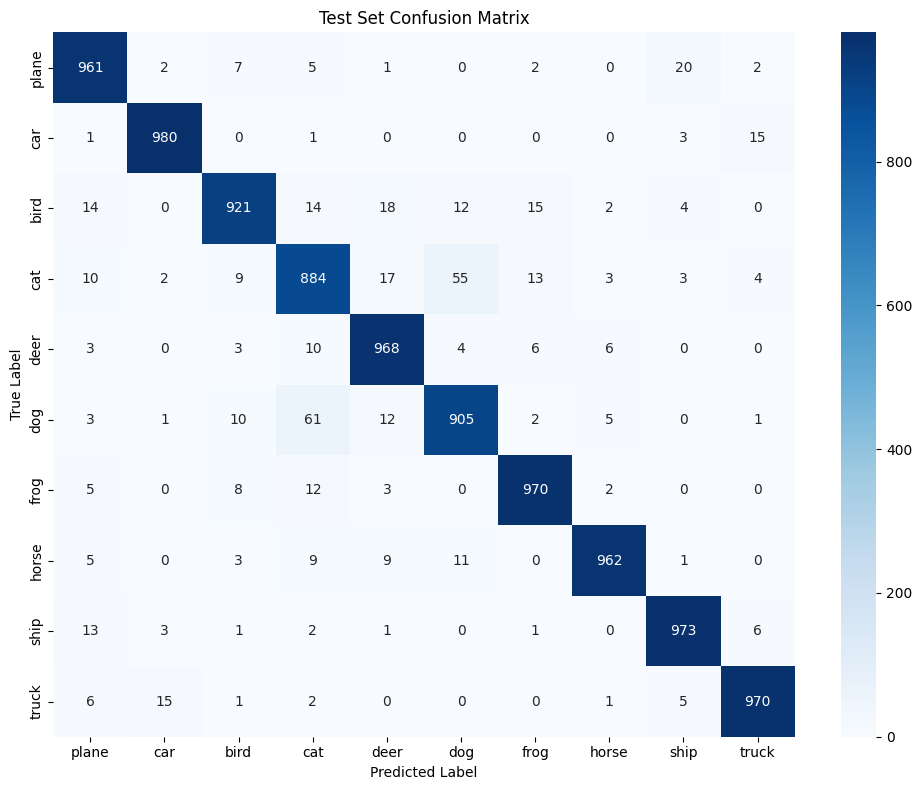

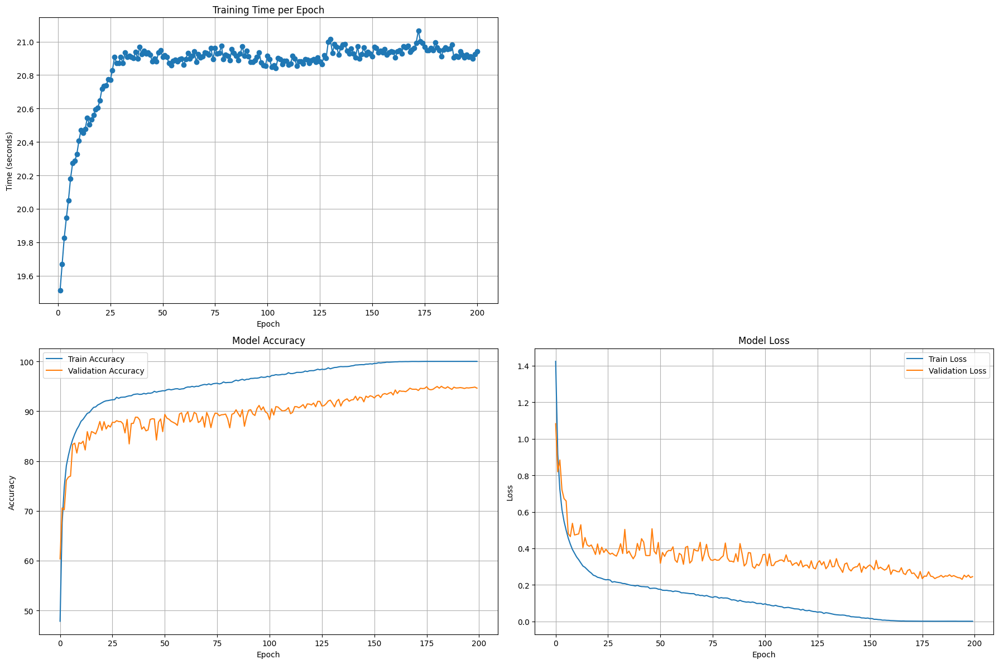


📊 FINAL SUMMARY
Total epochs: 200
Training time: 4301.62s (71.69 min)
Avg epoch time: 20.85s
Best validation accuracy: 95.00%
Final test accuracy: 94.94%
FLOPs: 0.56 GFLOPs

✅ Summary saved to training_summary.csv

🎉 Training complete! Final Test Accuracy = 94.94%



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import time
import pandas as pd
from torch.optim.lr_scheduler import CosineAnnealingLR
from thop import profile  # For calculating FLOPs

# GPU Configuration
def configure_gpu():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if torch.cuda.is_available():
        print(f"Num GPUs Available: {torch.cuda.device_count()}")
        torch.cuda.empty_cache()
        print("GPU memory cleared")

    return device


def load_images(batch_size=128, train_size=45000, val_size=5000, test_size=10000):
    """
    Loads CIFAR-10 with:
      - 45,000 training samples
      - 5,000 validation samples (from original train set)
      - 10,000 test samples (unchanged)
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    full_train_dataset = datasets.CIFAR10(
        root='./data',
        train=True,
        download=True,
        transform=transform_train
    )

    full_test_dataset = datasets.CIFAR10(
        root='./data',
        train=False,
        download=True,
        transform=transform_test
    )

    class_names = ['plane', 'car', 'bird', 'cat', 'deer',
                   'dog', 'frog', 'horse', 'ship', 'truck']

    # Stratified split: 45k train, 5k val (from original 50k train)
    train_targets = np.array(full_train_dataset.targets)
    train_indices = []
    val_indices = []

    samples_per_class_train = train_size // 10  # 4500 per class
    samples_per_class_val = val_size // 10      # 500 per class

    for class_idx in range(10):
        class_indices = np.where(train_targets == class_idx)[0]
        np.random.shuffle(class_indices)
        train_class_indices = class_indices[:samples_per_class_train]
        val_class_indices = class_indices[samples_per_class_train:samples_per_class_train + samples_per_class_val]

        train_indices.extend(train_class_indices.tolist())
        val_indices.extend(val_class_indices.tolist())

    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)

    print(f"\nStratified split created:")
    print(f"Training samples: {len(train_indices)} (4500/class)")
    print(f"Validation samples: {len(val_indices)} (500/class)")
    print(f"Test samples: {test_size}")

    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)
    test_dataset = Subset(full_test_dataset, np.arange(test_size))

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    print(f"\nDataLoaders created:")
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")

    return train_loader, val_loader, test_loader, class_names


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        return out

def ResNet18(num_classes=10):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)


def calculate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nModel Parameters:")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    return total_params, trainable_params


def calculate_flops(model, input_size=(3, 32, 32)):
    device = next(model.parameters()).device
    dummy_input = torch.randn(1, *input_size).to(device)

    try:
        flops, params = profile(model, inputs=(dummy_input,), verbose=False)
        print(f"\nModel Computational Requirements:")
        print(f"FLOPs: {flops:,} ({flops/1e9:.2f} GFLOPs)")
        return flops
    except Exception as e:
        print(f"FLOPs calculation failed: {e}")
        return None


def train_epoch(model, device, train_loader, optimizer, epoch, scheduler=None):
    model.train()
    train_loss = 0
    correct = 0
    total = 0

    start_time = time.time()
    total_images_processed = 0

    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()
        total_images_processed += data.size(0)

        if (batch_idx + 1) % 50 == 0:
            print(f'Train Epoch: {epoch} [{total_images_processed}/{len(train_loader.dataset)} '
                  f'({100. * (batch_idx + 1) / len(train_loader):.0f}%)]\t'
                  f'Loss: {loss.item():.6f}\tAccuracy: {100. * correct / total:.2f}%')

    end_time = time.time()
    training_time = end_time - start_time

    images_per_second = total_images_processed / training_time if training_time > 0 else 0

    epoch_loss = train_loss / len(train_loader)
    epoch_acc = 100. * correct / total

    if scheduler is not None:
        scheduler.step()

    print(f"\nEpoch {epoch} completed in {training_time:.2f} seconds")
    print(f"Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")
    print(f"Throughput: {images_per_second:.2f} images/second")

    return epoch_loss, epoch_acc, training_time


def validate(model, device, loader, loader_name="Validation"):
    model.eval()
    val_loss = 0
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += F.cross_entropy(output, target).item()
            pred = output.argmax(dim=1)
            correct += pred.eq(target).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    val_loss /= len(loader)
    val_acc = 100. * correct / len(loader.dataset)

    print(f"{loader_name} Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")

    return val_loss, val_acc, all_targets, all_preds


def plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    plt.plot(range(1, len(epoch_times) + 1), epoch_times, marker='o')
    plt.title('Training Time per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_metrics.pdf')
    plt.show()


def plot_confusion_matrix(all_targets, all_preds, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(all_targets, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


def run_cifar10_classification():
    device = configure_gpu()

    total_epochs = 200
    batch_size = 128
    learning_rate = 0.05
    weight_decay = 5e-4
    momentum = 0.9


    # Load train, val, test splits
    train_loader, val_loader, test_loader, class_names = load_images(
        batch_size=batch_size,
        train_size=45000,
        val_size=5000,
        test_size=10000
    )

    model = ResNet18(num_classes=10).to(device)
    print(model)

    total_params, trainable_params = calculate_model_parameters(model)
    flops = calculate_flops(model)

    optimizer = optim.SGD(model.parameters(),
                         lr=learning_rate,
                         momentum=momentum,
                         weight_decay=weight_decay,
                         nesterov=True)
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)

    # History
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epoch_times = []

    total_training_start = time.time()

    best_val_acc = 0
    best_model_state = None
    patience_counter = 0

    for epoch in range(1, total_epochs + 1):
        print(f"\n{'='*50}")
        print(f"EPOCH {epoch}/{total_epochs}")
        print(f"{'='*50}")

        train_loss, train_acc, epoch_time = train_epoch(
            model, device, train_loader, optimizer, epoch, scheduler=scheduler
        )

        epoch_times.append(epoch_time)
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        # Validate on validation set
        val_loss, val_acc, _, _ = validate(model, device, val_loader, "Validation")
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            torch.save(model.state_dict(), 'best_resnet18.pth')
            patience_counter = 0
            print(f"✓ New best validation accuracy: {best_val_acc:.2f}%")
        else:
            patience_counter += 1


    # Load best model for final test
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"\nLoaded best model (val acc: {best_val_acc:.2f}%) for final test.")

    # FINAL TEST EVALUATION
    print(f"\n{'='*60}")
    print("🔍 FINAL TEST EVALUATION (on untouched 10k test set)")
    print(f"{'='*60}")
    test_loss, test_acc, test_targets, test_preds = validate(model, device, test_loader, "Test")
    print(f"✅ FINAL TEST ACCURACY: {test_acc:.2f}%")
    print(f"{'='*60}")

    # Confusion matrix for test set
    plot_confusion_matrix(test_targets, test_preds, class_names, "Test Set Confusion Matrix")

    total_training_end = time.time()
    total_training_time = total_training_end - total_training_start
    avg_epoch_time = np.mean(epoch_times) if epoch_times else 0

    total_epochs_completed = len(epoch_times)

    plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs)

    # Final stats
    print(f"\n📊 FINAL SUMMARY")
    print(f"Total epochs: {total_epochs_completed}")
    print(f"Training time: {total_training_time:.2f}s ({total_training_time/60:.2f} min)")
    print(f"Avg epoch time: {avg_epoch_time:.2f}s")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")
    print(f"Final test accuracy: {test_acc:.2f}%")
    if flops:
        print(f"FLOPs: {flops/1e9:.2f} GFLOPs")

    # Save summary
    summary_data = {
        'total_training_time_sec': [total_training_time],
        'average_epoch_time_sec': [avg_epoch_time],
        'epochs_completed': [total_epochs_completed],
        'best_validation_accuracy': [best_val_acc],
        'final_test_accuracy': [test_acc],
        'total_parameters': [total_params],
        'learning_rate': [learning_rate],
        'weight_decay': [weight_decay]
    }

    summary_df = pd.DataFrame(summary_data)
    summary_df.to_csv('training_summary.csv', index=False)
    print("\n✅ Summary saved to training_summary.csv")

    return model, summary_df, test_acc


if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    model, summary_df, test_accuracy = run_cifar10_classification()

    print(f"\n🎉 Training complete! Final Test Accuracy = {test_accuracy:.2f}%\n")

### Pruning

Using device: cuda
Num GPUs Available: 1
GPU memory cleared
Files already downloaded and verified
Files already downloaded and verified

Stratified split created:
Training samples: 45000 (4500/class)
Validation samples: 5000 (500/class)
Test samples: 10000

DataLoaders created:
Train batches: 352 | Val batches: 40 | Test batches: 79
Total original batches per epoch: 352
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequent

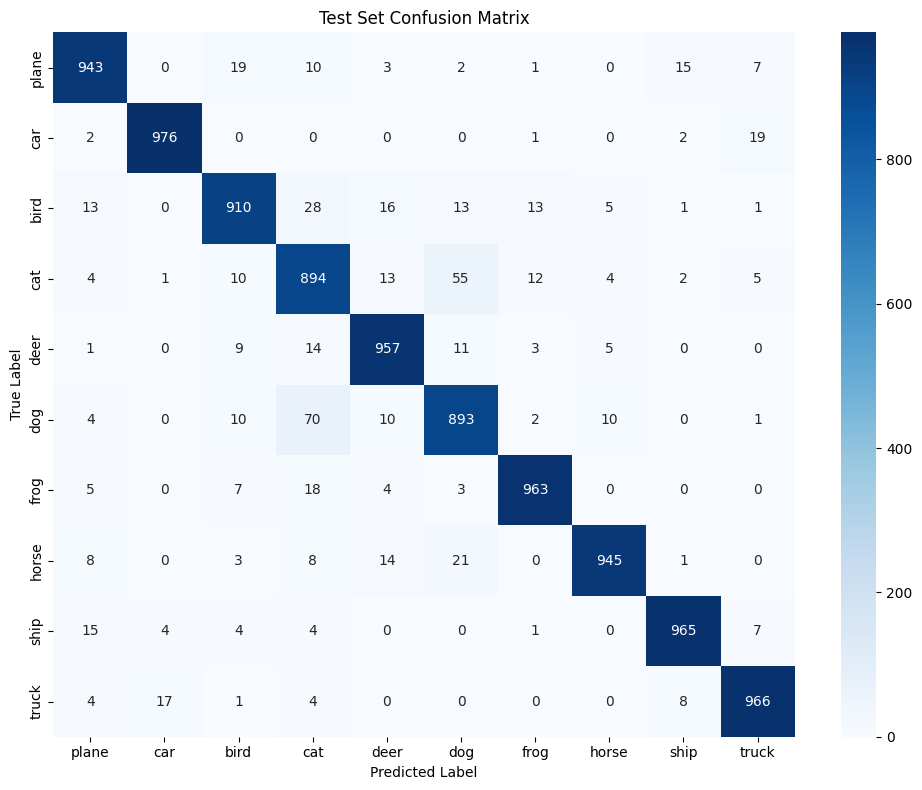

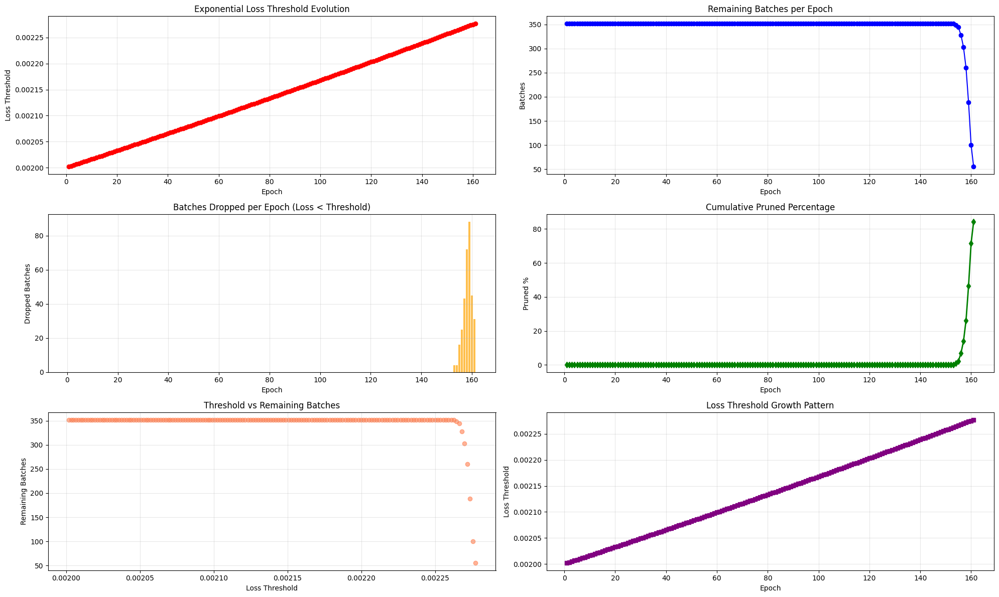

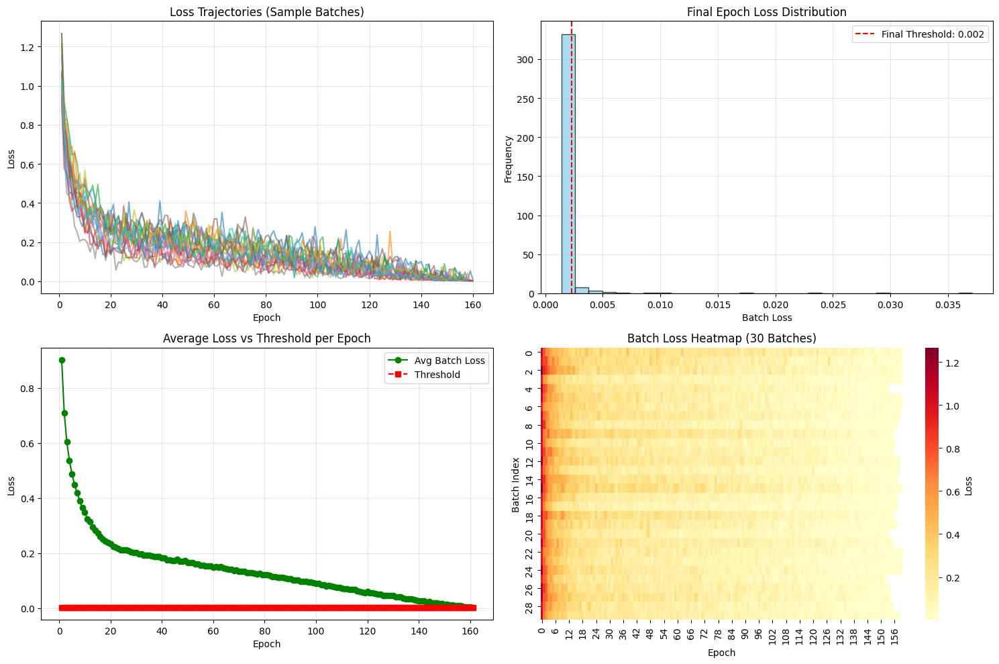

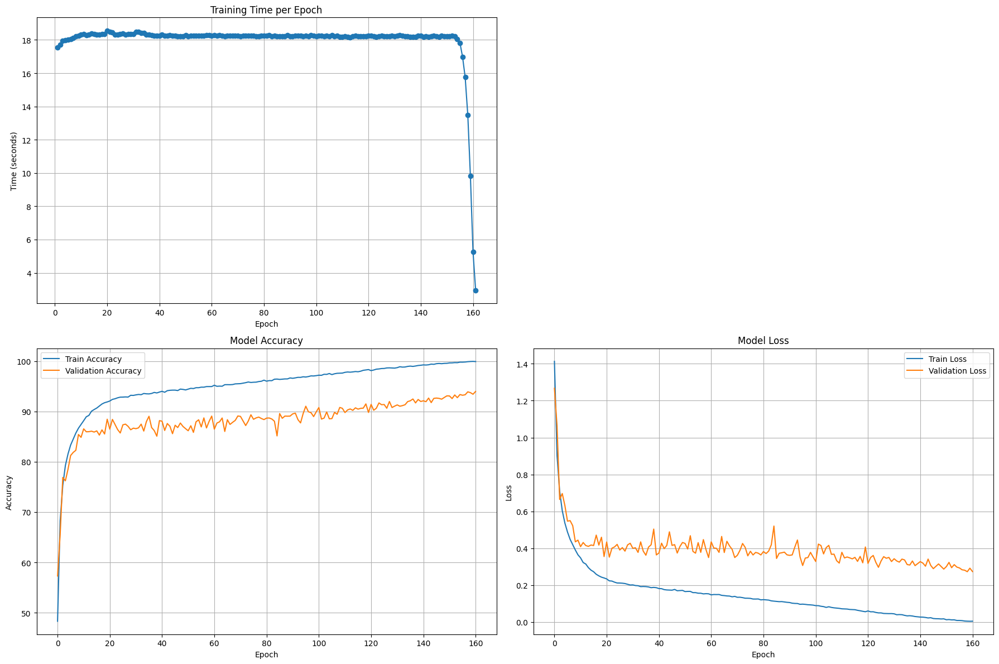


📊 FINAL SUMMARY
Data Utilization Index (DUI): 0.7924
Total epochs: 161
Training time: 3003.49s (50.06 min)
Avg epoch time: 17.96s
Best validation accuracy: 93.98%
Final test accuracy: 94.12%
Batches dropped: 328/352 (93.18%)
FLOPs: 0.56 GFLOPs

✅ Summary saved to loss_based_batch_pruning_summary.csv
✅ Threshold history saved to loss_threshold_history.csv

🎉 Training complete! Final Test Accuracy = 94.12%



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import time
import pandas as pd
from torch.optim.lr_scheduler import CosineAnnealingLR
from thop import profile  # For calculating FLOPs
import math

GLOBAL_TRAIN_BATCH_INDICES = None

# GPU Configuration
def configure_gpu():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if torch.cuda.is_available():
        print(f"Num GPUs Available: {torch.cuda.device_count()}")
        torch.cuda.empty_cache()
        print("GPU memory cleared")

    return device


def load_images(batch_size=128, train_size=45000, val_size=5000, test_size=10000):
    """
    Loads CIFAR-10 with:
      - 45,000 training samples
      - 5,000 validation samples (from original train set)
      - 10,000 test samples (unchanged)
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
    ])

    full_train_dataset = datasets.CIFAR10(
        root='./data',
        train=True,
        download=True,
        transform=transform_train
    )

    full_test_dataset = datasets.CIFAR10(
        root='./data',
        train=False,
        download=True,
        transform=transform_test
    )

    class_names = ['plane', 'car', 'bird', 'cat', 'deer',
                   'dog', 'frog', 'horse', 'ship', 'truck']

    # Stratified split: 45k train, 5k val (from original 50k train)
    train_targets = np.array(full_train_dataset.targets)
    train_indices = []
    val_indices = []

    samples_per_class_train = train_size // 10  # 4500 per class
    samples_per_class_val = val_size // 10      # 500 per class

    for class_idx in range(10):
        class_indices = np.where(train_targets == class_idx)[0]
        np.random.shuffle(class_indices)
        train_class_indices = class_indices[:samples_per_class_train]
        val_class_indices = class_indices[samples_per_class_train:samples_per_class_train + samples_per_class_val]

        train_indices.extend(train_class_indices.tolist())
        val_indices.extend(val_class_indices.tolist())

    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)

    print(f"\nStratified split created:")
    print(f"Training samples: {len(train_indices)} (4500/class)")
    print(f"Validation samples: {len(val_indices)} (500/class)")
    print(f"Test samples: {test_size}")

    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)
    test_dataset = Subset(full_test_dataset, np.arange(test_size))  # Use first 10k

    # Consistent Batch Handling for Training
    num_samples = len(train_dataset)
    indices = np.arange(num_samples)
    np.random.shuffle(indices)

    batch_indices = [
        indices[i:i + batch_size].tolist()
        for i in range(0, num_samples, batch_size)
    ]

    global GLOBAL_TRAIN_BATCH_INDICES
    GLOBAL_TRAIN_BATCH_INDICES = batch_indices

    class BatchIndexSampler:
        def __init__(self, batch_indices_list, shuffle_within_batch=True):
            self.batch_indices_list = batch_indices_list
            self.shuffle_within_batch = shuffle_within_batch

        def __iter__(self):
            batch_indices = [b.copy() for b in self.batch_indices_list]
            for batch_idx in batch_indices:
                if self.shuffle_within_batch:
                    np.random.shuffle(batch_idx)
                yield from batch_idx

        def __len__(self):
            return sum(len(b) for b in self.batch_indices_list)

    sampler = BatchIndexSampler(batch_indices, shuffle_within_batch=True)

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        sampler=sampler,
        num_workers=4,
        pin_memory=True,
        drop_last=False
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    print(f"\nDataLoaders created:")
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")

    return train_loader, val_loader, test_loader, class_names


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        return out

def ResNet18(num_classes=10):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)


def calculate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nModel Parameters:")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    return total_params, trainable_params


def calculate_flops(model, input_size=(3, 32, 32)):
    device = next(model.parameters()).device
    dummy_input = torch.randn(1, *input_size).to(device)

    try:
        flops, params = profile(model, inputs=(dummy_input,), verbose=False)
        print(f"\nModel Computational Requirements:")
        print(f"FLOPs: {flops:,} ({flops/1e9:.2f} GFLOPs)")
        return flops
    except Exception as e:
        print(f"FLOPs calculation failed: {e}")
        return None


def train_epoch(model, device, train_loader, optimizer, epoch, batch_indices=None, scheduler=None, threshold=0.5):
    model.train()
    train_loss = 0
    correct = 0
    total = 0

    batch_losses = {}
    batch_indices_list = []

    start_time = time.time()
    total_images_processed = 0
    batch_processing_times = []

    global GLOBAL_TRAIN_BATCH_INDICES
    total_logical_batches = len(GLOBAL_TRAIN_BATCH_INDICES)

    active_batch_indices = batch_indices if batch_indices is not None else list(range(total_logical_batches))
    print(f"Using {len(active_batch_indices)} out of {total_logical_batches} batches")

    data_iter = iter(train_loader)

    for logical_batch_idx in active_batch_indices:
        try:
            data, target = next(data_iter)
        except StopIteration:
            break

        batch_start_time = time.time()
        batch_indices_list.append(logical_batch_idx)

        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)

        batch_losses[logical_batch_idx] = loss.item()

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()

        batch_end_time = time.time()
        batch_time = batch_end_time - batch_start_time
        batch_processing_times.append(batch_time)
        total_images_processed += data.size(0)

        if len(batch_indices_list) % 10 == 0:
            print(f'Train Epoch: {epoch} [{total_images_processed}/{len(active_batch_indices) * data.size(0)} '
                  f'({100. * len(batch_indices_list) / len(active_batch_indices):.0f}%)]\t'
                  f'Loss: {loss.item():.6f}\tAccuracy: {100. * correct / total:.2f}%')

    end_time = time.time()
    training_time = end_time - start_time

    loss_df = pd.DataFrame({
        'batch_idx': list(batch_losses.keys()),
        'loss': list(batch_losses.values())
    }).set_index('batch_idx')

    avg_batch_time = np.mean(batch_processing_times) if batch_processing_times else 0
    images_per_second = total_images_processed / training_time if training_time > 0 else 0

    epoch_loss = train_loss / len(batch_indices_list) if batch_indices_list else 0
    epoch_acc = 100. * correct / total if total > 0 else 0

    if scheduler is not None:
        scheduler.step()

    print(f"\nEpoch {epoch} completed in {training_time:.2f} seconds")
    print(f"Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")
    print(f"Throughput: {images_per_second:.2f} images/second, Avg batch time: {avg_batch_time:.4f} s")
    print(f"Current loss threshold: {threshold:.6f}")

    throughput_metrics = {
        'epoch_time': training_time,
        'images_per_second': images_per_second,
        'avg_batch_time': avg_batch_time,
        'total_batches': len(batch_indices_list)
    }

    return epoch_loss, epoch_acc, loss_df, batch_indices_list, throughput_metrics


def validate(model, device, loader, loader_name="Validation"):
    model.eval()
    val_loss = 0
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += F.cross_entropy(output, target).item()
            pred = output.argmax(dim=1)
            correct += pred.eq(target).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    val_loss /= len(loader)
    val_acc = 100. * correct / len(loader.dataset)

    print(f"{loader_name} Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")

    return val_loss, val_acc, all_targets, all_preds


def plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    plt.plot(range(1, len(epoch_times) + 1), epoch_times, marker='o')
    plt.title('Training Time per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_metrics_loss_based_pruning.pdf')
    plt.show()


def plot_confusion_matrix(all_targets, all_preds, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(all_targets, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


def calculate_exponential_threshold(delta_start, delta_end, T, t):
    alpha = math.log(delta_end / delta_start) / T
    threshold = delta_start * math.exp(alpha * t)
    return threshold


def plot_batch_prune_analysis(threshold_history, remaining_batches_history,
                            dropped_per_epoch_history, pruned_percentage_history):
    plt.figure(figsize=(20, 12))

    plt.subplot(3, 2, 1)
    plt.plot(range(1, len(threshold_history) + 1), threshold_history, marker='o', color='red')
    plt.title('Exponential Loss Threshold Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 2)
    plt.plot(range(1, len(remaining_batches_history) + 1), remaining_batches_history, marker='o', color='blue')
    plt.title('Remaining Batches per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 3)
    plt.bar(range(1, len(dropped_per_epoch_history) + 1), dropped_per_epoch_history, color='orange', alpha=0.7)
    plt.title('Batches Dropped per Epoch (Loss < Threshold)')
    plt.xlabel('Epoch')
    plt.ylabel('Dropped Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 4)
    plt.plot(range(1, len(pruned_percentage_history) + 1), pruned_percentage_history,
             marker='d', color='green', linewidth=2)
    plt.title('Cumulative Pruned Percentage')
    plt.xlabel('Epoch')
    plt.ylabel('Pruned %')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 5)
    plt.scatter(threshold_history, remaining_batches_history, alpha=0.6, color='coral')
    plt.title('Threshold vs Remaining Batches')
    plt.xlabel('Loss Threshold')
    plt.ylabel('Remaining Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 6)
    epochs = range(1, len(threshold_history) + 1)
    plt.plot(epochs, threshold_history, marker='s', color='purple', linewidth=2)
    plt.title('Loss Threshold Growth Pattern')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('batch_prune_loss_based_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def plot_batch_loss_analysis(batch_loss_history, threshold_history):
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    sample_batches = list(batch_loss_history.keys())[:20]
    for idx in sample_batches:
        losses = batch_loss_history[idx]
        plt.plot(range(1, len(losses) + 1), losses, alpha=0.6, label=f'Batch {idx}')
    plt.title('Loss Trajectories (Sample Batches)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 2)
    final_losses = [batch_loss_history[i][-1] for i in batch_loss_history if batch_loss_history[i]]
    plt.hist(final_losses, bins=30, alpha=0.7, color='skyblue', edgecolor='k')
    if threshold_history:
        plt.axvline(threshold_history[-1], color='red', linestyle='--', label=f'Final Threshold: {threshold_history[-1]:.3f}')
    plt.title('Final Epoch Loss Distribution')
    plt.xlabel('Batch Loss')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 3)
    if batch_loss_history:
        max_epochs = max(len(l) for l in batch_loss_history.values())
        avg_losses = []
        for e in range(max_epochs):
            epoch_losses = [batch_loss_history[i][e] for i in batch_loss_history if len(batch_loss_history[i]) > e]
            avg_losses.append(np.mean(epoch_losses))
        plt.plot(range(1, len(avg_losses)+1), avg_losses, marker='o', label='Avg Batch Loss', color='green')
        plt.plot(range(1, len(threshold_history)+1), threshold_history, '--', marker='s', label='Threshold', color='red')
        plt.title('Average Loss vs Threshold per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 4)
    if batch_loss_history:
        sorted_batches = sorted(batch_loss_history.keys())[:30]
        max_epochs = max(len(l) for l in batch_loss_history.values())
        loss_matrix = []
        for b in sorted_batches:
            losses = batch_loss_history[b]
            padded = losses + [np.nan] * (max_epochs - len(losses))
            loss_matrix.append(padded[:max_epochs])
        loss_matrix = np.array(loss_matrix)
        sns.heatmap(loss_matrix, cmap='YlOrRd', cbar_kws={'label': 'Loss'})
        plt.title('Batch Loss Heatmap (30 Batches)')
        plt.xlabel('Epoch')
        plt.ylabel('Batch Index')

    plt.tight_layout()
    plt.savefig('batch_loss_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def run_cifar10_classification():
    device = configure_gpu()

    total_epochs = 200
    batch_size = 128
    learning_rate = 0.05
    weight_decay = 5e-4
    momentum = 0.9


    delta_start = 0.002    # Start threshold (prune low-loss easy batches) 0.008
    delta_end = 0.00235      # End threshold 0.04
    min_batch_percentage = 0.1  # Keep at least 10% batches

    # NEW: Load train, val, test splits
    train_loader, val_loader, test_loader, class_names = load_images(
        batch_size=batch_size,
        train_size=45000,
        val_size=5000,
        test_size=10000
    )

    total_original_batches = len(train_loader)
    print(f"Total original batches per epoch: {total_original_batches}")

    model = ResNet18(num_classes=10).to(device)
    print(model)

    total_params, trainable_params = calculate_model_parameters(model)
    flops = calculate_flops(model)

    optimizer = optim.SGD(model.parameters(),
                         lr=learning_rate,
                         momentum=momentum,
                         weight_decay=weight_decay,
                         nesterov=True)
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)

    # History
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epoch_times = []

    # Pruning tracking
    prev_epoch_loss_df = None
    batch_indices_to_use = None
    total_dropped_batches = 0
    total_remaining_batches = []
    total_batches_dropped_per_epoch = []

    threshold_history = []
    pruned_percentage_history = []
    batch_loss_history = {}

    total_training_start = time.time()

    best_val_acc = 0
    best_model_state = None
    patience_counter = 0

    for epoch in range(1, total_epochs + 1):
        print(f"\n{'='*50}")
        print(f"EPOCH {epoch}/{total_epochs}")
        print(f"{'='*50}")

        current_threshold = calculate_exponential_threshold(delta_start, delta_end, total_epochs, epoch)
        threshold_history.append(current_threshold)

        train_loss, train_acc, current_loss_df, used_batch_indices, throughput_metrics = train_epoch(
            model, device, train_loader, optimizer, epoch,
            batch_indices=batch_indices_to_use,
            scheduler=scheduler,
            threshold=current_threshold
        )

        epoch_times.append(throughput_metrics['epoch_time'])
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        current_remaining_batches = len(used_batch_indices) if used_batch_indices is not None else total_original_batches
        total_remaining_batches.append(current_remaining_batches)
        pruned_percent = (1 - current_remaining_batches / total_original_batches) * 100
        pruned_percentage_history.append(pruned_percent)

        # VALIDATE on validation set
        val_loss, val_acc, _, _ = validate(model, device, val_loader, "Validation")
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            torch.save(model.state_dict(), 'best_resnet18_loss_based_pruning.pth')
            patience_counter = 0
            print(f"✓ New best validation accuracy: {best_val_acc:.2f}%")
        else:
            patience_counter += 1

        batches_dropped_this_epoch = 0

        if epoch > 1 and prev_epoch_loss_df is not None:
            common_indices = set(prev_epoch_loss_df.index) & set(current_loss_df.index)
            batches_to_drop = []

            for idx in common_indices:
                curr_loss = current_loss_df.loc[idx, 'loss']
                if idx not in batch_loss_history:
                    batch_loss_history[idx] = []
                batch_loss_history[idx].append(curr_loss)

                if curr_loss < current_threshold:
                    batches_to_drop.append(idx)

            if batches_to_drop:
                total_dropped_batches += len(batches_to_drop)
                batches_dropped_this_epoch = len(batches_to_drop)

            batch_indices_to_use = [i for i in (batch_indices_to_use or range(total_original_batches)) if i not in batches_to_drop]

        prev_epoch_loss_df = current_loss_df
        total_batches_dropped_per_epoch.append(batches_dropped_this_epoch)

        if batch_indices_to_use is not None:
            pct = len(batch_indices_to_use) / total_original_batches * 100
            print(f"Batches remaining: {len(batch_indices_to_use)}/{total_original_batches} ({pct:.2f}%)")
            print(f"Total dropped so far: {total_dropped_batches} ({100 * total_dropped_batches / total_original_batches:.2f}%)")

        if batch_indices_to_use and len(batch_indices_to_use) <= total_original_batches * min_batch_percentage:
            print(f"\n🛑 Early stopping: < {min_batch_percentage*100}% batches remain.")
            break

    # Load best model for final test
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"\nLoaded best model (val acc: {best_val_acc:.2f}%) for final test.")

    # FINAL TEST EVALUATION
    print(f"\n{'='*60}")
    print("🔍 FINAL TEST EVALUATION (on untouched 10k test set)")
    print(f"{'='*60}")
    test_loss, test_acc, test_targets, test_preds = validate(model, device, test_loader, "Test")
    print(f"✅ FINAL TEST ACCURACY: {test_acc:.2f}%")
    print(f"{'='*60}")

    # Confusion matrix for test set
    plot_confusion_matrix(test_targets, test_preds, class_names, "Test Set Confusion Matrix")

    total_training_end = time.time()
    total_training_time = total_training_end - total_training_start
    avg_epoch_time = np.mean(epoch_times) if epoch_times else 0

    total_epochs_completed = len(epoch_times)
    sum_remaining_batches = sum(total_remaining_batches)
    max_batches = total_epochs * total_original_batches
    data_utilization_index = sum_remaining_batches / max_batches if max_batches > 0 else 0

    plot_batch_prune_analysis(threshold_history, total_remaining_batches,
                            total_batches_dropped_per_epoch, pruned_percentage_history)
    plot_batch_loss_analysis(batch_loss_history, threshold_history)
    plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs)

    # Final stats
    percent_dropped = 100 * total_dropped_batches / total_original_batches
    percent_remaining = 100 - percent_dropped

    print(f"\n📊 FINAL SUMMARY")
    print(f"Data Utilization Index (DUI): {data_utilization_index:.4f}")
    print(f"Total epochs: {total_epochs_completed}")
    print(f"Training time: {total_training_time:.2f}s ({total_training_time/60:.2f} min)")
    print(f"Avg epoch time: {avg_epoch_time:.2f}s")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")
    print(f"Final test accuracy: {test_acc:.2f}%")
    print(f"Batches dropped: {total_dropped_batches}/{total_original_batches} ({percent_dropped:.2f}%)")
    if flops:
        print(f"FLOPs: {flops/1e9:.2f} GFLOPs")

    # Save summary
    summary_data = {
        'total_training_time_sec': [total_training_time],
        'average_epoch_time_sec': [avg_epoch_time],
        'epochs_completed': [total_epochs_completed],
        'best_validation_accuracy': [best_val_acc],
        'final_test_accuracy': [test_acc],
        'total_parameters': [total_params],
        'data_utilization_index': [data_utilization_index],
        'total_batches_dropped': [total_dropped_batches],
        'batch_drop_percentage': [percent_dropped],
        'final_threshold': [threshold_history[-1] if threshold_history else delta_start],
        'delta_start': [delta_start],
        'delta_end': [delta_end],
        'learning_rate': [learning_rate],
        'weight_decay': [weight_decay]
    }

    summary_df = pd.DataFrame(summary_data)
    summary_df.to_csv('loss_based_batch_pruning_summary.csv', index=False)
    print("\n✅ Summary saved to loss_based_batch_pruning_summary.csv")

    threshold_df = pd.DataFrame({
        'epoch': range(1, len(threshold_history) + 1),
        'threshold': threshold_history,
        'remaining_batches': total_remaining_batches,
        'batches_dropped': total_batches_dropped_per_epoch,
        'pruned_percentage': pruned_percentage_history
    })
    threshold_df.to_csv('loss_threshold_history.csv', index=False)
    print("✅ Threshold history saved to loss_threshold_history.csv")

    return model, summary_df, test_acc


if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    model, summary_df, test_accuracy = run_cifar10_classification()

    print(f"\n🎉 Training complete! Final Test Accuracy = {test_accuracy:.2f}%\n")

# CIFAR - 100

## No Pruning

Using device: cuda
Num GPUs Available: 1
GPU memory cleared
Files already downloaded and verified
Files already downloaded and verified

Stratified split created:
Training samples: 45000 (450/class)
Validation samples: 5000 (50/class)
Test samples: 10000

DataLoaders created:
Train batches: 352 | Val batches: 40 | Test batches: 79
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (

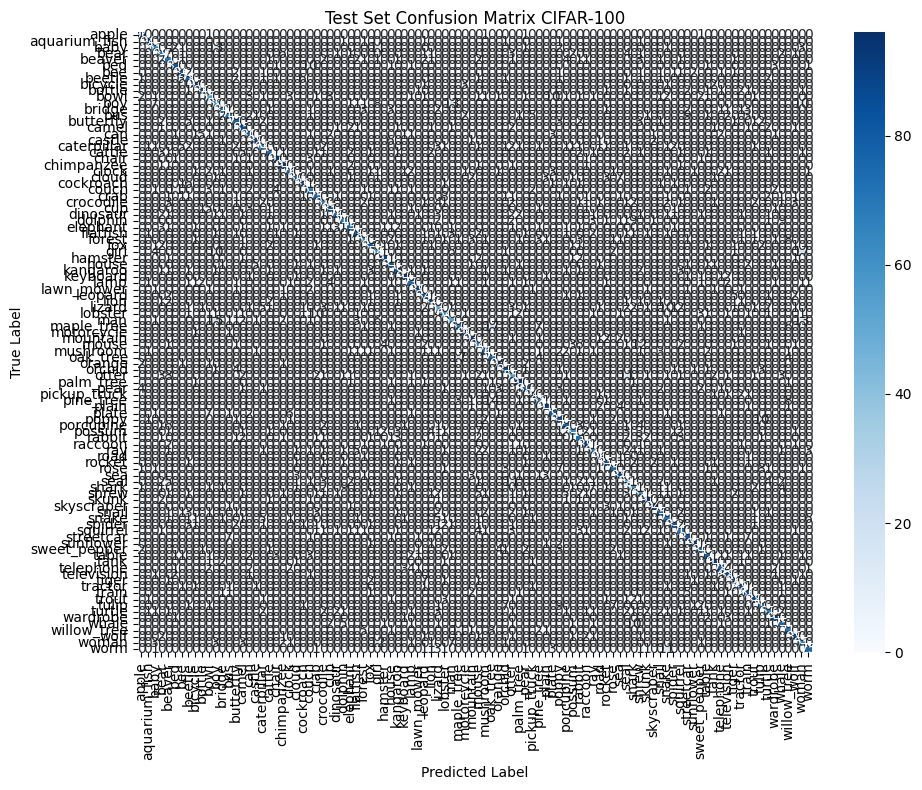

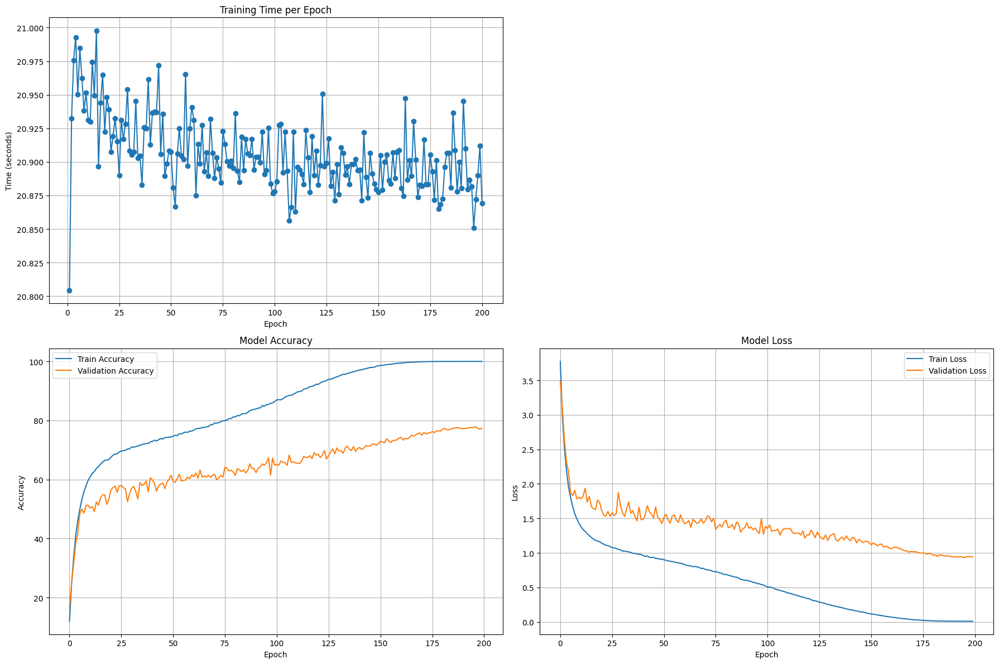


📊 FINAL SUMMARY
Total epochs: 200
Training time: 4323.26s (72.05 min)
Avg epoch time: 20.91s
Best validation accuracy: 77.86%
Final test accuracy: 78.41%
FLOPs: 0.56 GFLOPs

✅ Summary saved to training_summary_cifar100.csv

🎉 Training complete! Final Test Accuracy = 78.41%



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import time
import pandas as pd
from torch.optim.lr_scheduler import CosineAnnealingLR
from thop import profile  # For calculating FLOPs

# GPU Configuration
def configure_gpu():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if torch.cuda.is_available():
        print(f"Num GPUs Available: {torch.cuda.device_count()}")
        torch.cuda.empty_cache()
        print("GPU memory cleared")

    return device


def load_images(batch_size=128, train_size=45000, val_size=5000, test_size=10000):
    """
    Loads CIFAR-100 with:
      - 45,000 training samples
      - 5,000 validation samples (from original train set)
      - 10,000 test samples (unchanged)
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.5071, 0.4867, 0.4408), (0.2675, 0.2565, 0.2761))
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5071, 0.4867, 0.4408), (0.2675, 0.2565, 0.2761))
    ])

    full_train_dataset = datasets.CIFAR100(
        root='./data',
        train=True,
        download=True,
        transform=transform_train
    )

    full_test_dataset = datasets.CIFAR100(
        root='./data',
        train=False,
        download=True,
        transform=transform_test
    )

    # CIFAR-100 has 100 classes
    class_names = full_train_dataset.classes

    # Stratified split: 45k train, 5k val (from original 50k train)
    train_targets = np.array(full_train_dataset.targets)
    train_indices = []
    val_indices = []

    samples_per_class_train = train_size // 100  # 450 per class
    samples_per_class_val = val_size // 100      # 50 per class

    for class_idx in range(100):
        class_indices = np.where(train_targets == class_idx)[0]
        np.random.shuffle(class_indices)
        train_class_indices = class_indices[:samples_per_class_train]
        val_class_indices = class_indices[samples_per_class_train:samples_per_class_train + samples_per_class_val]

        train_indices.extend(train_class_indices.tolist())
        val_indices.extend(val_class_indices.tolist())

    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)

    print(f"\nStratified split created:")
    print(f"Training samples: {len(train_indices)} (450/class)")
    print(f"Validation samples: {len(val_indices)} (50/class)")
    print(f"Test samples: {test_size}")

    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)
    test_dataset = Subset(full_test_dataset, np.arange(test_size))

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    print(f"\nDataLoaders created:")
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")

    return train_loader, val_loader, test_loader, class_names


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        return out

def ResNet18(num_classes=100):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)


def calculate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nModel Parameters:")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    return total_params, trainable_params


def calculate_flops(model, input_size=(3, 32, 32)):
    device = next(model.parameters()).device
    dummy_input = torch.randn(1, *input_size).to(device)

    try:
        flops, params = profile(model, inputs=(dummy_input,), verbose=False)
        print(f"\nModel Computational Requirements:")
        print(f"FLOPs: {flops:,} ({flops/1e9:.2f} GFLOPs)")
        return flops
    except Exception as e:
        print(f"FLOPs calculation failed: {e}")
        return None


def train_epoch(model, device, train_loader, optimizer, epoch, scheduler=None):
    model.train()
    train_loss = 0
    correct = 0
    total = 0

    start_time = time.time()
    total_images_processed = 0

    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()
        total_images_processed += data.size(0)

        if (batch_idx + 1) % 50 == 0:
            print(f'Train Epoch: {epoch} [{total_images_processed}/{len(train_loader.dataset)} '
                  f'({100. * (batch_idx + 1) / len(train_loader):.0f}%)]\t'
                  f'Loss: {loss.item():.6f}\tAccuracy: {100. * correct / total:.2f}%')

    end_time = time.time()
    training_time = end_time - start_time

    images_per_second = total_images_processed / training_time if training_time > 0 else 0

    epoch_loss = train_loss / len(train_loader)
    epoch_acc = 100. * correct / total

    if scheduler is not None:
        scheduler.step()

    print(f"\nEpoch {epoch} completed in {training_time:.2f} seconds")
    print(f"Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")
    print(f"Throughput: {images_per_second:.2f} images/second")

    return epoch_loss, epoch_acc, training_time


def validate(model, device, loader, loader_name="Validation"):
    model.eval()
    val_loss = 0
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += F.cross_entropy(output, target).item()
            pred = output.argmax(dim=1)
            correct += pred.eq(target).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    val_loss /= len(loader)
    val_acc = 100. * correct / len(loader.dataset)

    print(f"{loader_name} Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")

    return val_loss, val_acc, all_targets, all_preds


def plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    plt.plot(range(1, len(epoch_times) + 1), epoch_times, marker='o')
    plt.title('Training Time per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_metrics.pdf')
    plt.show()


def plot_confusion_matrix(all_targets, all_preds, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(all_targets, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


def run_cifar100_classification():
    device = configure_gpu()

    total_epochs = 200
    batch_size = 128
    learning_rate = 0.1
    weight_decay = 5e-4
    momentum = 0.9


    # Load train, val, test splits
    train_loader, val_loader, test_loader, class_names = load_images(
        batch_size=batch_size,
        train_size=45000,
        val_size=5000,
        test_size=10000
    )

    model = ResNet18(num_classes=100).to(device)
    print(model)

    total_params, trainable_params = calculate_model_parameters(model)
    flops = calculate_flops(model)

    optimizer = optim.SGD(model.parameters(),
                         lr=learning_rate,
                         momentum=momentum,
                         weight_decay=weight_decay,
                         nesterov=True)
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)

    # History
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epoch_times = []

    total_training_start = time.time()

    best_val_acc = 0
    best_model_state = None
    patience_counter = 0

    for epoch in range(1, total_epochs + 1):
        print(f"\n{'='*50}")
        print(f"EPOCH {epoch}/{total_epochs}")
        print(f"{'='*50}")

        train_loss, train_acc, epoch_time = train_epoch(
            model, device, train_loader, optimizer, epoch, scheduler=scheduler
        )

        epoch_times.append(epoch_time)
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        # Validate on validation set
        val_loss, val_acc, _, _ = validate(model, device, val_loader, "Validation")
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            torch.save(model.state_dict(), 'best_resnet18_cifar100.pth')
            patience_counter = 0
            print(f"✓ New best validation accuracy: {best_val_acc:.2f}%")
        else:
            patience_counter += 1



    # Load best model for final test
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"\nLoaded best model (val acc: {best_val_acc:.2f}%) for final test.")

    # FINAL TEST EVALUATION
    print(f"\n{'='*60}")
    print("🔍 FINAL TEST EVALUATION (on untouched 10k test set)")
    print(f"{'='*60}")
    test_loss, test_acc, test_targets, test_preds = validate(model, device, test_loader, "Test")
    print(f"✅ FINAL TEST ACCURACY: {test_acc:.2f}%")
    print(f"{'='*60}")

    # Confusion matrix for test set
    plot_confusion_matrix(test_targets, test_preds, class_names, "Test Set Confusion Matrix CIFAR-100")

    total_training_end = time.time()
    total_training_time = total_training_end - total_training_start
    avg_epoch_time = np.mean(epoch_times) if epoch_times else 0

    total_epochs_completed = len(epoch_times)

    plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs)

    # Final stats
    print(f"\n📊 FINAL SUMMARY")
    print(f"Total epochs: {total_epochs_completed}")
    print(f"Training time: {total_training_time:.2f}s ({total_training_time/60:.2f} min)")
    print(f"Avg epoch time: {avg_epoch_time:.2f}s")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")
    print(f"Final test accuracy: {test_acc:.2f}%")
    if flops:
        print(f"FLOPs: {flops/1e9:.2f} GFLOPs")

    # Save summary
    summary_data = {
        'total_training_time_sec': [total_training_time],
        'average_epoch_time_sec': [avg_epoch_time],
        'epochs_completed': [total_epochs_completed],
        'best_validation_accuracy': [best_val_acc],
        'final_test_accuracy': [test_acc],
        'total_parameters': [total_params],
        'learning_rate': [learning_rate],
        'weight_decay': [weight_decay]
    }

    summary_df = pd.DataFrame(summary_data)
    summary_df.to_csv('training_summary_cifar100.csv', index=False)
    print("\n✅ Summary saved to training_summary_cifar100.csv")

    return model, summary_df, test_acc


if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    model, summary_df, test_accuracy = run_cifar100_classification()

    print(f"\n🎉 Training complete! Final Test Accuracy = {test_accuracy:.2f}%\n")

## Pruning

Using device: cuda
Num GPUs Available: 1
GPU memory cleared
Files already downloaded and verified
Files already downloaded and verified

Stratified split created:
Training samples: 45000 (450/class)
Validation samples: 5000 (50/class)
Test samples: 10000

DataLoaders created:
Train batches: 352 | Val batches: 40 | Test batches: 79
Total original batches per epoch: 352
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequentia

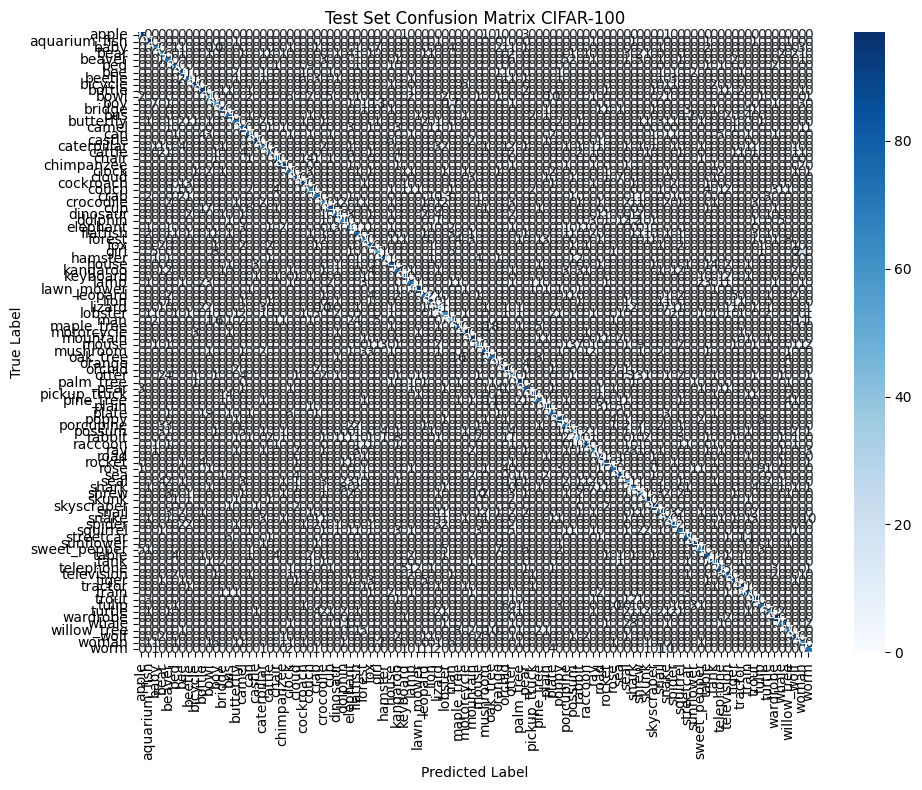

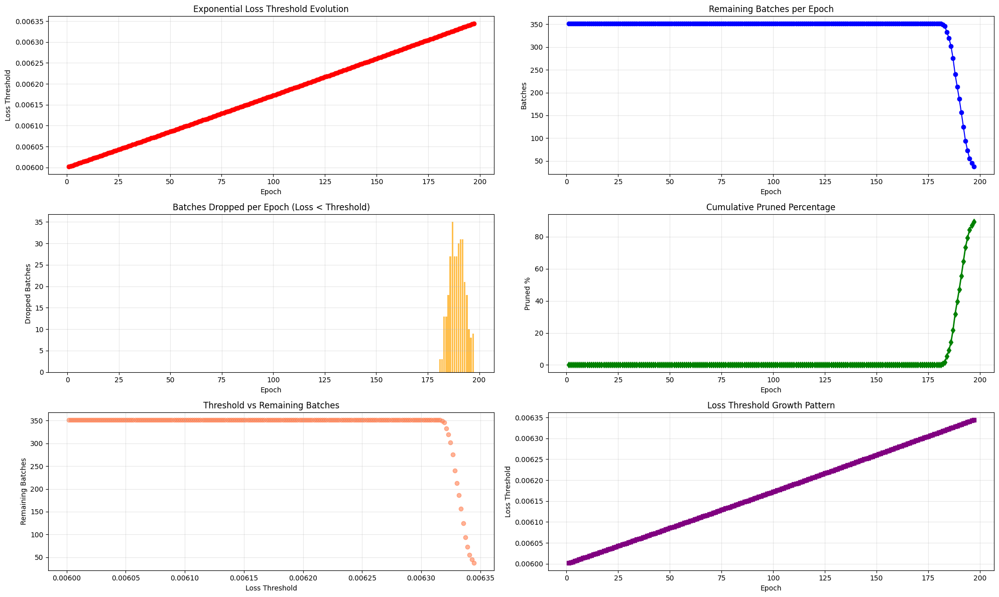

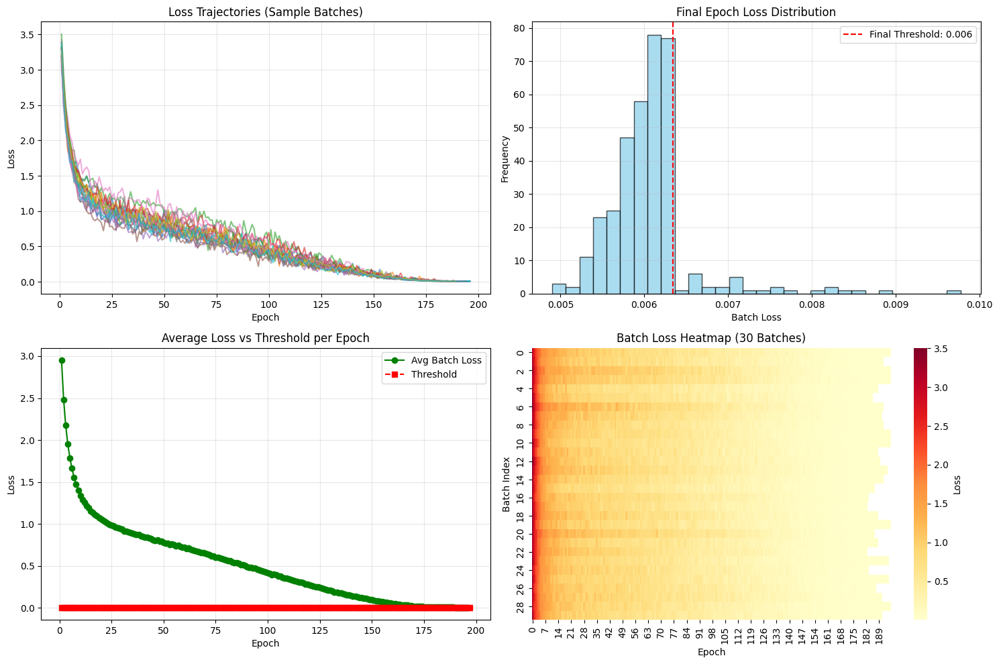

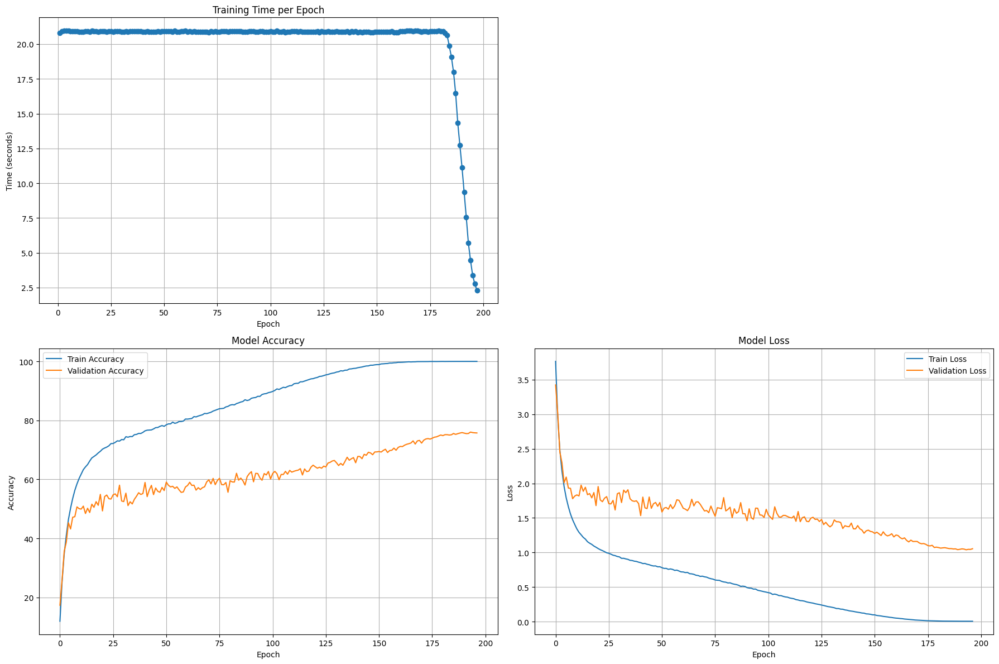


📊 FINAL SUMMARY
Data Utilization Index (DUI): 0.9497
Total epochs: 197
Training time: 4124.78s (68.75 min)
Avg epoch time: 20.16s
Best validation accuracy: 76.04%
Final test accuracy: 76.96%
Batches dropped: 324/352 (92.05%)
FLOPs: 0.56 GFLOPs

✅ Summary saved to loss_based_batch_pruning_summary_cifar100.csv
✅ Threshold history saved to loss_threshold_history_cifar100.csv

🎉 Training complete! Final Test Accuracy = 76.96%



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import time
import pandas as pd
from torch.optim.lr_scheduler import CosineAnnealingLR
from thop import profile  # For calculating FLOPs
import math

GLOBAL_TRAIN_BATCH_INDICES = None

# GPU Configuration
def configure_gpu():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if torch.cuda.is_available():
        print(f"Num GPUs Available: {torch.cuda.device_count()}")
        torch.cuda.empty_cache()
        print("GPU memory cleared")

    return device


def load_images(batch_size=128, train_size=45000, val_size=5000, test_size=10000):
    """
    Loads CIFAR-100 with:
      - 45,000 training samples
      - 5,000 validation samples (from original train set)
      - 10,000 test samples (unchanged)
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.5071, 0.4867, 0.4408), (0.2675, 0.2565, 0.2761))
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5071, 0.4867, 0.4408), (0.2675, 0.2565, 0.2761))
    ])

    full_train_dataset = datasets.CIFAR100(
        root='./data',
        train=True,
        download=True,
        transform=transform_train
    )

    full_test_dataset = datasets.CIFAR100(
        root='./data',
        train=False,
        download=True,
        transform=transform_test
    )

    # CIFAR-100 has 100 classes
    class_names = full_train_dataset.classes

    # Stratified split: 45k train, 5k val (from original 50k train)
    train_targets = np.array(full_train_dataset.targets)
    train_indices = []
    val_indices = []

    samples_per_class_train = train_size // 100  # 450 per class
    samples_per_class_val = val_size // 100      # 50 per class

    for class_idx in range(100):
        class_indices = np.where(train_targets == class_idx)[0]
        np.random.shuffle(class_indices)
        train_class_indices = class_indices[:samples_per_class_train]
        val_class_indices = class_indices[samples_per_class_train:samples_per_class_train + samples_per_class_val]

        train_indices.extend(train_class_indices.tolist())
        val_indices.extend(val_class_indices.tolist())

    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)

    print(f"\nStratified split created:")
    print(f"Training samples: {len(train_indices)} (450/class)")
    print(f"Validation samples: {len(val_indices)} (50/class)")
    print(f"Test samples: {test_size}")

    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)
    test_dataset = Subset(full_test_dataset, np.arange(test_size))

    # Consistent Batch Handling for Training
    num_samples = len(train_dataset)
    indices = np.arange(num_samples)
    np.random.shuffle(indices)

    batch_indices = [
        indices[i:i + batch_size].tolist()
        for i in range(0, num_samples, batch_size)
    ]

    global GLOBAL_TRAIN_BATCH_INDICES
    GLOBAL_TRAIN_BATCH_INDICES = batch_indices

    class BatchIndexSampler:
        def __init__(self, batch_indices_list, shuffle_within_batch=True):
            self.batch_indices_list = batch_indices_list
            self.shuffle_within_batch = shuffle_within_batch

        def __iter__(self):
            batch_indices = [b.copy() for b in self.batch_indices_list]
            for batch_idx in batch_indices:
                if self.shuffle_within_batch:
                    np.random.shuffle(batch_idx)
                yield from batch_idx

        def __len__(self):
            return sum(len(b) for b in self.batch_indices_list)

    sampler = BatchIndexSampler(batch_indices, shuffle_within_batch=True)

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        sampler=sampler,
        num_workers=4,
        pin_memory=True,
        drop_last=False
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    print(f"\nDataLoaders created:")
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")

    return train_loader, val_loader, test_loader, class_names


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        return out

def ResNet18(num_classes=100):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)


def calculate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nModel Parameters:")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    return total_params, trainable_params


def calculate_flops(model, input_size=(3, 32, 32)):
    device = next(model.parameters()).device
    dummy_input = torch.randn(1, *input_size).to(device)

    try:
        flops, params = profile(model, inputs=(dummy_input,), verbose=False)
        print(f"\nModel Computational Requirements:")
        print(f"FLOPs: {flops:,} ({flops/1e9:.2f} GFLOPs)")
        return flops
    except Exception as e:
        print(f"FLOPs calculation failed: {e}")
        return None


def train_epoch(model, device, train_loader, optimizer, epoch, batch_indices=None, scheduler=None, threshold=0.5):
    model.train()
    train_loss = 0
    correct = 0
    total = 0

    batch_losses = {}
    batch_indices_list = []

    start_time = time.time()
    total_images_processed = 0
    batch_processing_times = []

    global GLOBAL_TRAIN_BATCH_INDICES
    total_logical_batches = len(GLOBAL_TRAIN_BATCH_INDICES)

    active_batch_indices = batch_indices if batch_indices is not None else list(range(total_logical_batches))
    print(f"Using {len(active_batch_indices)} out of {total_logical_batches} batches")

    data_iter = iter(train_loader)

    for logical_batch_idx in active_batch_indices:
        try:
            data, target = next(data_iter)
        except StopIteration:
            break

        batch_start_time = time.time()
        batch_indices_list.append(logical_batch_idx)

        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)

        batch_losses[logical_batch_idx] = loss.item()

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()

        batch_end_time = time.time()
        batch_time = batch_end_time - batch_start_time
        batch_processing_times.append(batch_time)
        total_images_processed += data.size(0)

        if len(batch_indices_list) % 10 == 0:
            print(f'Train Epoch: {epoch} [{total_images_processed}/{len(active_batch_indices) * data.size(0)} '
                  f'({100. * len(batch_indices_list) / len(active_batch_indices):.0f}%)]\t'
                  f'Loss: {loss.item():.6f}\tAccuracy: {100. * correct / total:.2f}%')

    end_time = time.time()
    training_time = end_time - start_time

    loss_df = pd.DataFrame({
        'batch_idx': list(batch_losses.keys()),
        'loss': list(batch_losses.values())
    }).set_index('batch_idx')

    avg_batch_time = np.mean(batch_processing_times) if batch_processing_times else 0
    images_per_second = total_images_processed / training_time if training_time > 0 else 0

    epoch_loss = train_loss / len(batch_indices_list) if batch_indices_list else 0
    epoch_acc = 100. * correct / total if total > 0 else 0

    if scheduler is not None:
        scheduler.step()

    print(f"\nEpoch {epoch} completed in {training_time:.2f} seconds")
    print(f"Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")
    print(f"Throughput: {images_per_second:.2f} images/second, Avg batch time: {avg_batch_time:.4f} s")
    print(f"Current loss threshold: {threshold:.6f}")

    throughput_metrics = {
        'epoch_time': training_time,
        'images_per_second': images_per_second,
        'avg_batch_time': avg_batch_time,
        'total_batches': len(batch_indices_list)
    }

    return epoch_loss, epoch_acc, loss_df, batch_indices_list, throughput_metrics


def validate(model, device, loader, loader_name="Validation"):
    model.eval()
    val_loss = 0
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += F.cross_entropy(output, target).item()
            pred = output.argmax(dim=1)
            correct += pred.eq(target).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    val_loss /= len(loader)
    val_acc = 100. * correct / len(loader.dataset)

    print(f"{loader_name} Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")

    return val_loss, val_acc, all_targets, all_preds


def plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    plt.plot(range(1, len(epoch_times) + 1), epoch_times, marker='o')
    plt.title('Training Time per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_metrics_loss_based_pruning.pdf')
    plt.show()


def plot_confusion_matrix(all_targets, all_preds, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(all_targets, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


def calculate_exponential_threshold(delta_start, delta_end, T, t):
    alpha = math.log(delta_end / delta_start) / T
    threshold = delta_start * math.exp(alpha * t)
    return threshold


def plot_batch_prune_analysis(threshold_history, remaining_batches_history,
                            dropped_per_epoch_history, pruned_percentage_history):
    plt.figure(figsize=(20, 12))

    plt.subplot(3, 2, 1)
    plt.plot(range(1, len(threshold_history) + 1), threshold_history, marker='o', color='red')
    plt.title('Exponential Loss Threshold Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 2)
    plt.plot(range(1, len(remaining_batches_history) + 1), remaining_batches_history, marker='o', color='blue')
    plt.title('Remaining Batches per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 3)
    plt.bar(range(1, len(dropped_per_epoch_history) + 1), dropped_per_epoch_history, color='orange', alpha=0.7)
    plt.title('Batches Dropped per Epoch (Loss < Threshold)')
    plt.xlabel('Epoch')
    plt.ylabel('Dropped Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 4)
    plt.plot(range(1, len(pruned_percentage_history) + 1), pruned_percentage_history,
             marker='d', color='green', linewidth=2)
    plt.title('Cumulative Pruned Percentage')
    plt.xlabel('Epoch')
    plt.ylabel('Pruned %')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 5)
    plt.scatter(threshold_history, remaining_batches_history, alpha=0.6, color='coral')
    plt.title('Threshold vs Remaining Batches')
    plt.xlabel('Loss Threshold')
    plt.ylabel('Remaining Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 6)
    epochs = range(1, len(threshold_history) + 1)
    plt.plot(epochs, threshold_history, marker='s', color='purple', linewidth=2)
    plt.title('Loss Threshold Growth Pattern')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('batch_prune_loss_based_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def plot_batch_loss_analysis(batch_loss_history, threshold_history):
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    sample_batches = list(batch_loss_history.keys())[:20]
    for idx in sample_batches:
        losses = batch_loss_history[idx]
        plt.plot(range(1, len(losses) + 1), losses, alpha=0.6, label=f'Batch {idx}')
    plt.title('Loss Trajectories (Sample Batches)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 2)
    final_losses = [batch_loss_history[i][-1] for i in batch_loss_history if batch_loss_history[i]]
    plt.hist(final_losses, bins=30, alpha=0.7, color='skyblue', edgecolor='k')
    if threshold_history:
        plt.axvline(threshold_history[-1], color='red', linestyle='--', label=f'Final Threshold: {threshold_history[-1]:.3f}')
    plt.title('Final Epoch Loss Distribution')
    plt.xlabel('Batch Loss')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 3)
    if batch_loss_history:
        max_epochs = max(len(l) for l in batch_loss_history.values())
        avg_losses = []
        for e in range(max_epochs):
            epoch_losses = [batch_loss_history[i][e] for i in batch_loss_history if len(batch_loss_history[i]) > e]
            avg_losses.append(np.mean(epoch_losses))
        plt.plot(range(1, len(avg_losses)+1), avg_losses, marker='o', label='Avg Batch Loss', color='green')
        plt.plot(range(1, len(threshold_history)+1), threshold_history, '--', marker='s', label='Threshold', color='red')
        plt.title('Average Loss vs Threshold per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 4)
    if batch_loss_history:
        sorted_batches = sorted(batch_loss_history.keys())[:30]
        max_epochs = max(len(l) for l in batch_loss_history.values())
        loss_matrix = []
        for b in sorted_batches:
            losses = batch_loss_history[b]
            padded = losses + [np.nan] * (max_epochs - len(losses))
            loss_matrix.append(padded[:max_epochs])
        loss_matrix = np.array(loss_matrix)
        sns.heatmap(loss_matrix, cmap='YlOrRd', cbar_kws={'label': 'Loss'})
        plt.title('Batch Loss Heatmap (30 Batches)')
        plt.xlabel('Epoch')
        plt.ylabel('Batch Index')

    plt.tight_layout()
    plt.savefig('batch_loss_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def run_cifar100_classification():
    device = configure_gpu()

    total_epochs = 200
    batch_size = 128
    learning_rate = 0.1
    weight_decay = 5e-4
    momentum = 0.9


    delta_start = 0.006
    delta_end = 0.00635
    min_batch_percentage = 0.1  # Keep at least 10% batches

    # Load train, val, test splits
    train_loader, val_loader, test_loader, class_names = load_images(
        batch_size=batch_size,
        train_size=45000,
        val_size=5000,
        test_size=10000
    )

    total_original_batches = len(train_loader)
    print(f"Total original batches per epoch: {total_original_batches}")

    model = ResNet18(num_classes=100).to(device)
    print(model)

    total_params, trainable_params = calculate_model_parameters(model)
    flops = calculate_flops(model)

    optimizer = optim.SGD(model.parameters(),
                         lr=learning_rate,
                         momentum=momentum,
                         weight_decay=weight_decay,
                         nesterov=True)
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)

    # History
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epoch_times = []

    # Pruning tracking
    prev_epoch_loss_df = None
    batch_indices_to_use = None
    total_dropped_batches = 0
    total_remaining_batches = []
    total_batches_dropped_per_epoch = []

    threshold_history = []
    pruned_percentage_history = []
    batch_loss_history = {}

    total_training_start = time.time()

    best_val_acc = 0
    best_model_state = None
    patience_counter = 0

    for epoch in range(1, total_epochs + 1):
        print(f"\n{'='*50}")
        print(f"EPOCH {epoch}/{total_epochs}")
        print(f"{'='*50}")

        current_threshold = calculate_exponential_threshold(delta_start, delta_end, total_epochs, epoch)
        threshold_history.append(current_threshold)

        train_loss, train_acc, current_loss_df, used_batch_indices, throughput_metrics = train_epoch(
            model, device, train_loader, optimizer, epoch,
            batch_indices=batch_indices_to_use,
            scheduler=scheduler,
            threshold=current_threshold
        )

        epoch_times.append(throughput_metrics['epoch_time'])
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        current_remaining_batches = len(used_batch_indices) if used_batch_indices is not None else total_original_batches
        total_remaining_batches.append(current_remaining_batches)
        pruned_percent = (1 - current_remaining_batches / total_original_batches) * 100
        pruned_percentage_history.append(pruned_percent)

        # VALIDATE on validation set
        val_loss, val_acc, _, _ = validate(model, device, val_loader, "Validation")
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            torch.save(model.state_dict(), 'best_resnet18_cifar100_loss_based_pruning.pth')
            patience_counter = 0
            print(f"✓ New best validation accuracy: {best_val_acc:.2f}%")
        else:
            patience_counter += 1

        batches_dropped_this_epoch = 0

        if epoch > 1 and prev_epoch_loss_df is not None:
            common_indices = set(prev_epoch_loss_df.index) & set(current_loss_df.index)
            batches_to_drop = []

            for idx in common_indices:
                curr_loss = current_loss_df.loc[idx, 'loss']
                if idx not in batch_loss_history:
                    batch_loss_history[idx] = []
                batch_loss_history[idx].append(curr_loss)

                if curr_loss < current_threshold:
                    batches_to_drop.append(idx)

            if batches_to_drop:
                total_dropped_batches += len(batches_to_drop)
                batches_dropped_this_epoch = len(batches_to_drop)

            batch_indices_to_use = [i for i in (batch_indices_to_use or range(total_original_batches)) if i not in batches_to_drop]

        prev_epoch_loss_df = current_loss_df
        total_batches_dropped_per_epoch.append(batches_dropped_this_epoch)

        if batch_indices_to_use is not None:
            pct = len(batch_indices_to_use) / total_original_batches * 100
            print(f"Batches remaining: {len(batch_indices_to_use)}/{total_original_batches} ({pct:.2f}%)")
            print(f"Total dropped so far: {total_dropped_batches} ({100 * total_dropped_batches / total_original_batches:.2f}%)")

        if batch_indices_to_use and len(batch_indices_to_use) <= total_original_batches * min_batch_percentage:
            print(f"\n🛑 Early stopping: < {min_batch_percentage*100}% batches remain.")
            break

    # Load best model for final test
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"\nLoaded best model (val acc: {best_val_acc:.2f}%) for final test.")

    # FINAL TEST EVALUATION
    print(f"\n{'='*60}")
    print("🔍 FINAL TEST EVALUATION (on untouched 10k test set)")
    print(f"{'='*60}")
    test_loss, test_acc, test_targets, test_preds = validate(model, device, test_loader, "Test")
    print(f"✅ FINAL TEST ACCURACY: {test_acc:.2f}%")
    print(f"{'='*60}")

    # Confusion matrix for test set
    plot_confusion_matrix(test_targets, test_preds, class_names, "Test Set Confusion Matrix CIFAR-100")

    total_training_end = time.time()
    total_training_time = total_training_end - total_training_start
    avg_epoch_time = np.mean(epoch_times) if epoch_times else 0

    total_epochs_completed = len(epoch_times)
    sum_remaining_batches = sum(total_remaining_batches)
    max_batches = total_epochs * total_original_batches
    data_utilization_index = sum_remaining_batches / max_batches if max_batches > 0 else 0

    plot_batch_prune_analysis(threshold_history, total_remaining_batches,
                            total_batches_dropped_per_epoch, pruned_percentage_history)
    plot_batch_loss_analysis(batch_loss_history, threshold_history)
    plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs)

    # Final stats
    percent_dropped = 100 * total_dropped_batches / total_original_batches
    percent_remaining = 100 - percent_dropped

    print(f"\n📊 FINAL SUMMARY")
    print(f"Data Utilization Index (DUI): {data_utilization_index:.4f}")
    print(f"Total epochs: {total_epochs_completed}")
    print(f"Training time: {total_training_time:.2f}s ({total_training_time/60:.2f} min)")
    print(f"Avg epoch time: {avg_epoch_time:.2f}s")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")
    print(f"Final test accuracy: {test_acc:.2f}%")
    print(f"Batches dropped: {total_dropped_batches}/{total_original_batches} ({percent_dropped:.2f}%)")
    if flops:
        print(f"FLOPs: {flops/1e9:.2f} GFLOPs")

    # Save summary
    summary_data = {
        'total_training_time_sec': [total_training_time],
        'average_epoch_time_sec': [avg_epoch_time],
        'epochs_completed': [total_epochs_completed],
        'best_validation_accuracy': [best_val_acc],
        'final_test_accuracy': [test_acc],
        'total_parameters': [total_params],
        'data_utilization_index': [data_utilization_index],
        'total_batches_dropped': [total_dropped_batches],
        'batch_drop_percentage': [percent_dropped],
        'final_threshold': [threshold_history[-1] if threshold_history else delta_start],
        'delta_start': [delta_start],
        'delta_end': [delta_end],
        'learning_rate': [learning_rate],
        'weight_decay': [weight_decay]
    }

    summary_df = pd.DataFrame(summary_data)
    summary_df.to_csv('loss_based_batch_pruning_summary_cifar100.csv', index=False)
    print("\n✅ Summary saved to loss_based_batch_pruning_summary_cifar100.csv")

    threshold_df = pd.DataFrame({
        'epoch': range(1, len(threshold_history) + 1),
        'threshold': threshold_history,
        'remaining_batches': total_remaining_batches,
        'batches_dropped': total_batches_dropped_per_epoch,
        'pruned_percentage': pruned_percentage_history
    })
    threshold_df.to_csv('loss_threshold_history_cifar100.csv', index=False)
    print("✅ Threshold history saved to loss_threshold_history_cifar100.csv")

    return model, summary_df, test_acc


if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    model, summary_df, test_accuracy = run_cifar100_classification()

    print(f"\n🎉 Training complete! Final Test Accuracy = {test_accuracy:.2f}%\n")

# SVHN

## No Pruning

Using device: cuda
Num GPUs Available: 1
GPU memory cleared
Using downloaded and verified file: ./data/train_32x32.mat
Using downloaded and verified file: ./data/test_32x32.mat

Stratified split created:
Training samples: 65927
Validation samples: 7330
Test samples: 26032

DataLoaders created:
Train batches: 516 | Val batches: 58 | Test batches: 204
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): 

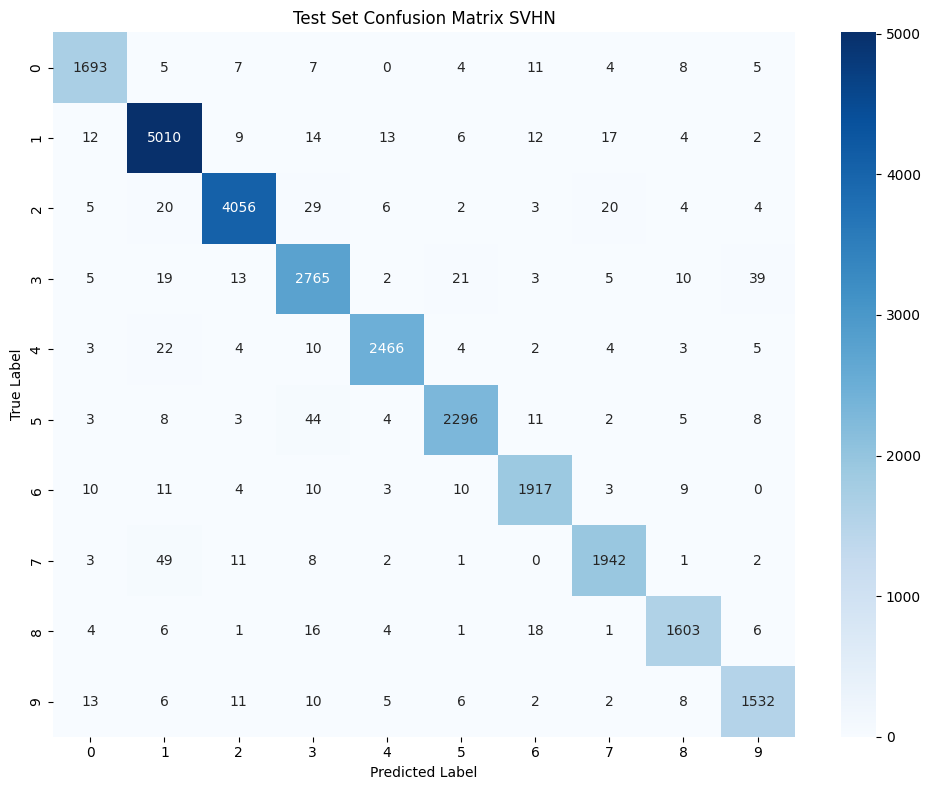

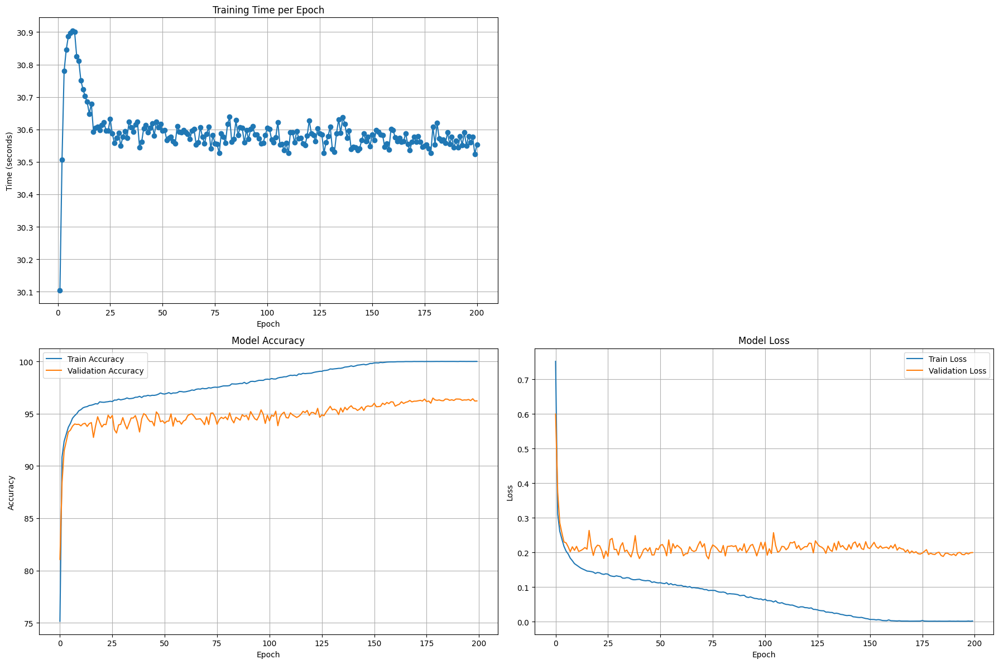


📊 FINAL SUMMARY
Total epochs: 200
Training time: 6295.84s (104.93 min)
Avg epoch time: 30.59s
Best validation accuracy: 96.49%
Final test accuracy: 97.11%
FLOPs: 0.56 GFLOPs

✅ Summary saved to training_summary_svhn.csv

🎉 Training complete! Final Test Accuracy = 97.11%



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import time
import pandas as pd
from torch.optim.lr_scheduler import CosineAnnealingLR
from thop import profile  # For calculating FLOPs

# GPU Configuration
def configure_gpu():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if torch.cuda.is_available():
        print(f"Num GPUs Available: {torch.cuda.device_count()}")
        torch.cuda.empty_cache()
        print("GPU memory cleared")

    return device


def load_images(batch_size=128, train_size=65931, val_size=7326, test_size=26032):
    """
    Loads SVHN with:
      - 65,931 training samples (90% of original train set)
      - 7,326 validation samples (10% of original train set)
      - 26,032 test samples (unchanged)
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.ToTensor(),
        transforms.Normalize((0.4377, 0.4438, 0.4728), (0.1980, 0.2010, 0.1970))
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4377, 0.4438, 0.4728), (0.1980, 0.2010, 0.1970))
    ])

    full_train_dataset = datasets.SVHN(
        root='./data',
        split='train',
        download=True,
        transform=transform_train
    )

    full_test_dataset = datasets.SVHN(
        root='./data',
        split='test',
        download=True,
        transform=transform_test
    )

    # SVHN has 10 classes (digits 0-9)
    class_names = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

    # Stratified split: 90% train, 10% val (from original train set)
    train_targets = np.array(full_train_dataset.labels)
    train_indices = []
    val_indices = []

    for class_idx in range(10):
        class_indices = np.where(train_targets == class_idx)[0]
        np.random.shuffle(class_indices)

        # Split 90/10
        split_point = int(len(class_indices) * 0.9)
        train_class_indices = class_indices[:split_point]
        val_class_indices = class_indices[split_point:]

        train_indices.extend(train_class_indices.tolist())
        val_indices.extend(val_class_indices.tolist())

    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)

    print(f"\nStratified split created:")
    print(f"Training samples: {len(train_indices)}")
    print(f"Validation samples: {len(val_indices)}")
    print(f"Test samples: {len(full_test_dataset)}")

    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)
    test_dataset = full_test_dataset

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    print(f"\nDataLoaders created:")
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")

    return train_loader, val_loader, test_loader, class_names


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        return out

def ResNet18(num_classes=10):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)


def calculate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nModel Parameters:")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    return total_params, trainable_params


def calculate_flops(model, input_size=(3, 32, 32)):
    device = next(model.parameters()).device
    dummy_input = torch.randn(1, *input_size).to(device)

    try:
        flops, params = profile(model, inputs=(dummy_input,), verbose=False)
        print(f"\nModel Computational Requirements:")
        print(f"FLOPs: {flops:,} ({flops/1e9:.2f} GFLOPs)")
        return flops
    except Exception as e:
        print(f"FLOPs calculation failed: {e}")
        return None


def train_epoch(model, device, train_loader, optimizer, epoch, scheduler=None):
    model.train()
    train_loss = 0
    correct = 0
    total = 0

    start_time = time.time()
    total_images_processed = 0

    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()
        total_images_processed += data.size(0)

        if (batch_idx + 1) % 50 == 0:
            print(f'Train Epoch: {epoch} [{total_images_processed}/{len(train_loader.dataset)} '
                  f'({100. * (batch_idx + 1) / len(train_loader):.0f}%)]\t'
                  f'Loss: {loss.item():.6f}\tAccuracy: {100. * correct / total:.2f}%')

    end_time = time.time()
    training_time = end_time - start_time

    images_per_second = total_images_processed / training_time if training_time > 0 else 0

    epoch_loss = train_loss / len(train_loader)
    epoch_acc = 100. * correct / total

    if scheduler is not None:
        scheduler.step()

    print(f"\nEpoch {epoch} completed in {training_time:.2f} seconds")
    print(f"Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")
    print(f"Throughput: {images_per_second:.2f} images/second")

    return epoch_loss, epoch_acc, training_time


def validate(model, device, loader, loader_name="Validation"):
    model.eval()
    val_loss = 0
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += F.cross_entropy(output, target).item()
            pred = output.argmax(dim=1)
            correct += pred.eq(target).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    val_loss /= len(loader)
    val_acc = 100. * correct / len(loader.dataset)

    print(f"{loader_name} Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")

    return val_loss, val_acc, all_targets, all_preds


def plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    plt.plot(range(1, len(epoch_times) + 1), epoch_times, marker='o')
    plt.title('Training Time per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_metrics.pdf')
    plt.show()


def plot_confusion_matrix(all_targets, all_preds, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(all_targets, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


def run_svhn_classification():
    device = configure_gpu()

    total_epochs = 200
    batch_size = 128
    learning_rate = 0.05
    weight_decay = 5e-4
    momentum = 0.9

    # Load train, val, test splits
    train_loader, val_loader, test_loader, class_names = load_images(
        batch_size=batch_size
    )

    model = ResNet18(num_classes=10).to(device)
    print(model)

    total_params, trainable_params = calculate_model_parameters(model)
    flops = calculate_flops(model)

    optimizer = optim.SGD(model.parameters(),
                         lr=learning_rate,
                         momentum=momentum,
                         weight_decay=weight_decay,
                         nesterov=True)
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)

    # History
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epoch_times = []

    total_training_start = time.time()

    best_val_acc = 0
    best_model_state = None
    patience_counter = 0

    for epoch in range(1, total_epochs + 1):
        print(f"\n{'='*50}")
        print(f"EPOCH {epoch}/{total_epochs}")
        print(f"{'='*50}")

        train_loss, train_acc, epoch_time = train_epoch(
            model, device, train_loader, optimizer, epoch, scheduler=scheduler
        )

        epoch_times.append(epoch_time)
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        # Validate on validation set
        val_loss, val_acc, _, _ = validate(model, device, val_loader, "Validation")
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            torch.save(model.state_dict(), 'best_resnet18_svhn.pth')
            patience_counter = 0
            print(f"✓ New best validation accuracy: {best_val_acc:.2f}%")
        else:
            patience_counter += 1


    # Load best model for final test
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"\nLoaded best model (val acc: {best_val_acc:.2f}%) for final test.")

    # FINAL TEST EVALUATION
    print(f"\n{'='*60}")
    print("🔍 FINAL TEST EVALUATION (on untouched test set)")
    print(f"{'='*60}")
    test_loss, test_acc, test_targets, test_preds = validate(model, device, test_loader, "Test")
    print(f"✅ FINAL TEST ACCURACY: {test_acc:.2f}%")
    print(f"{'='*60}")

    # Confusion matrix for test set
    plot_confusion_matrix(test_targets, test_preds, class_names, "Test Set Confusion Matrix SVHN")

    total_training_end = time.time()
    total_training_time = total_training_end - total_training_start
    avg_epoch_time = np.mean(epoch_times) if epoch_times else 0

    total_epochs_completed = len(epoch_times)

    plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs)

    # Final stats
    print(f"\n📊 FINAL SUMMARY")
    print(f"Total epochs: {total_epochs_completed}")
    print(f"Training time: {total_training_time:.2f}s ({total_training_time/60:.2f} min)")
    print(f"Avg epoch time: {avg_epoch_time:.2f}s")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")
    print(f"Final test accuracy: {test_acc:.2f}%")
    if flops:
        print(f"FLOPs: {flops/1e9:.2f} GFLOPs")

    # Save summary
    summary_data = {
        'total_training_time_sec': [total_training_time],
        'average_epoch_time_sec': [avg_epoch_time],
        'epochs_completed': [total_epochs_completed],
        'best_validation_accuracy': [best_val_acc],
        'final_test_accuracy': [test_acc],
        'total_parameters': [total_params],
        'learning_rate': [learning_rate],
        'weight_decay': [weight_decay]
    }

    summary_df = pd.DataFrame(summary_data)
    summary_df.to_csv('training_summary_svhn.csv', index=False)
    print("\n✅ Summary saved to training_summary_svhn.csv")

    return model, summary_df, test_acc


if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    model, summary_df, test_accuracy = run_svhn_classification()

    print(f"\n🎉 Training complete! Final Test Accuracy = {test_accuracy:.2f}%\n")

## Pruning

Using device: cuda
Num GPUs Available: 1
GPU memory cleared
Using downloaded and verified file: ./data/train_32x32.mat
Using downloaded and verified file: ./data/test_32x32.mat

Stratified split created:
Training samples: 65927
Validation samples: 7330
Test samples: 26032

DataLoaders created:
Train batches: 516 | Val batches: 58 | Test batches: 204
Total original batches per epoch: 516
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (s

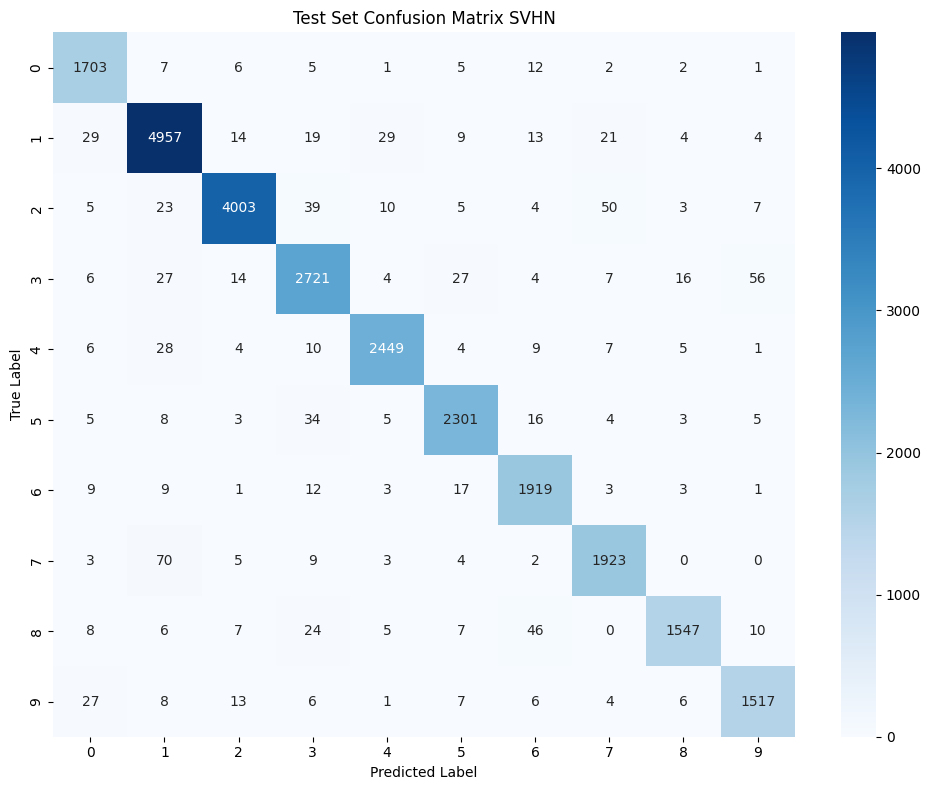

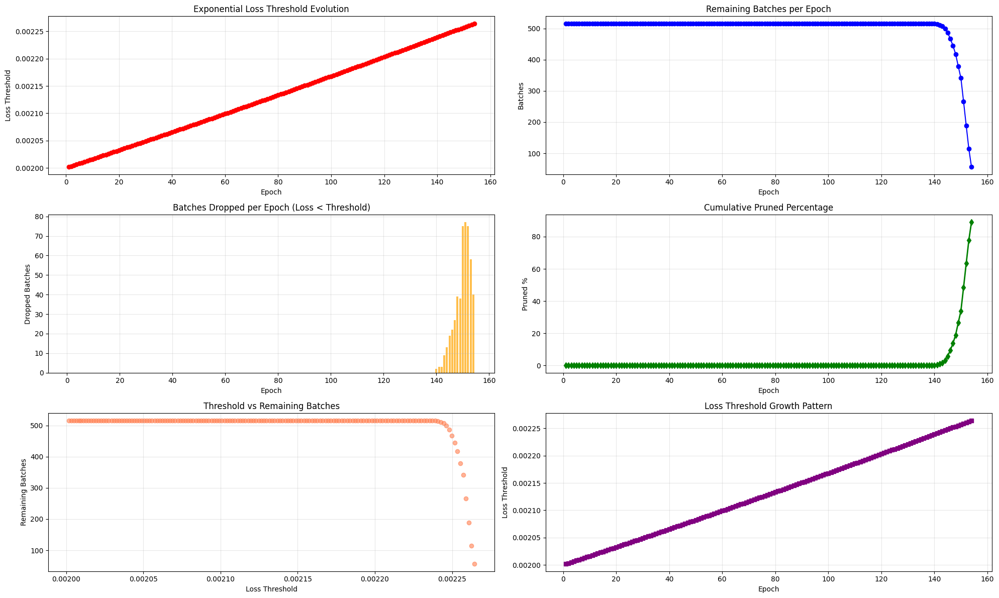

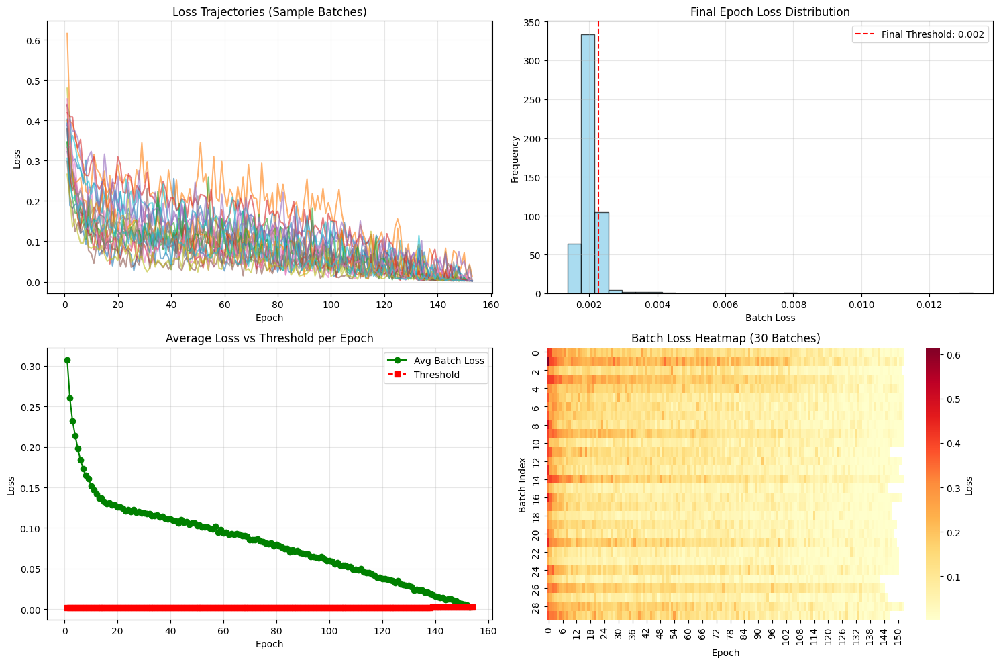

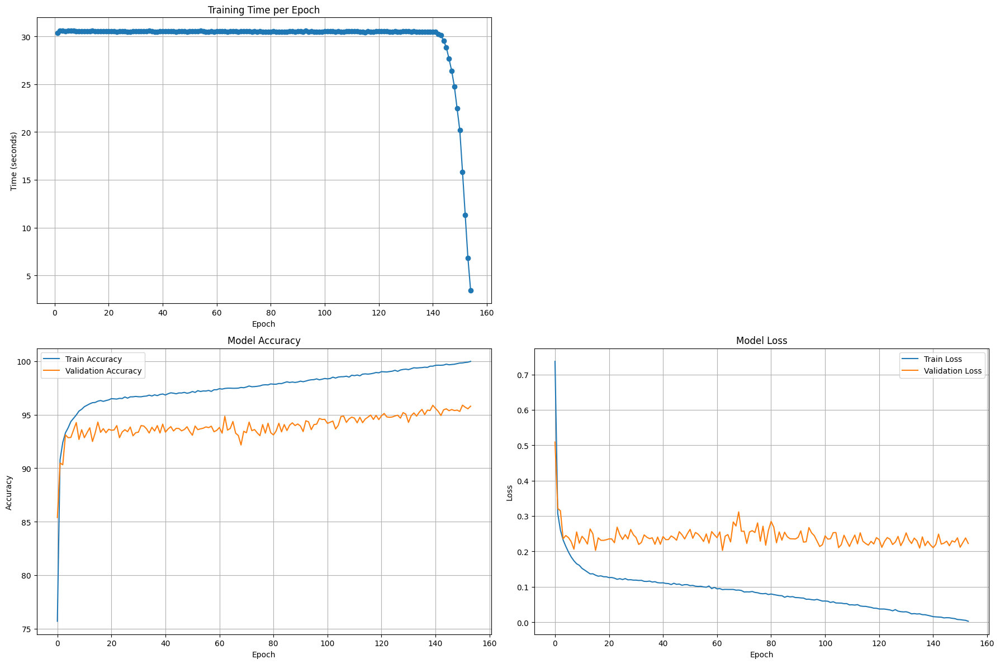


📊 FINAL SUMMARY
Data Utilization Index (DUI): 0.7503
Total epochs: 154
Training time: 4725.31s (78.76 min)
Avg epoch time: 29.74s
Best validation accuracy: 95.89%
Final test accuracy: 96.19%
Batches dropped: 500/516 (96.90%)
FLOPs: 0.56 GFLOPs

✅ Summary saved to loss_based_batch_pruning_summary_svhn.csv
✅ Threshold history saved to loss_threshold_history_svhn.csv

🎉 Training complete! Final Test Accuracy = 96.19%



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import time
import pandas as pd
from torch.optim.lr_scheduler import CosineAnnealingLR
from thop import profile  # For calculating FLOPs
import math

GLOBAL_TRAIN_BATCH_INDICES = None

# GPU Configuration
def configure_gpu():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    if torch.cuda.is_available():
        print(f"Num GPUs Available: {torch.cuda.device_count()}")
        torch.cuda.empty_cache()
        print("GPU memory cleared")

    return device


def load_images(batch_size=128, train_size=65931, val_size=7326, test_size=26032):
    """
    Loads SVHN with:
      - 65,931 training samples (90% of original train set)
      - 7,326 validation samples (10% of original train set)
      - 26,032 test samples (unchanged)
    """
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.ToTensor(),
        transforms.Normalize((0.4377, 0.4438, 0.4728), (0.1980, 0.2010, 0.1970))
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4377, 0.4438, 0.4728), (0.1980, 0.2010, 0.1970))
    ])

    full_train_dataset = datasets.SVHN(
        root='./data',
        split='train',
        download=True,
        transform=transform_train
    )

    full_test_dataset = datasets.SVHN(
        root='./data',
        split='test',
        download=True,
        transform=transform_test
    )

    # SVHN has 10 classes (digits 0-9)
    class_names = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

    # Stratified split: 90% train, 10% val (from original train set)
    train_targets = np.array(full_train_dataset.labels)
    train_indices = []
    val_indices = []

    for class_idx in range(10):
        class_indices = np.where(train_targets == class_idx)[0]
        np.random.shuffle(class_indices)

        # Split 90/10
        split_point = int(len(class_indices) * 0.9)
        train_class_indices = class_indices[:split_point]
        val_class_indices = class_indices[split_point:]

        train_indices.extend(train_class_indices.tolist())
        val_indices.extend(val_class_indices.tolist())

    np.random.shuffle(train_indices)
    np.random.shuffle(val_indices)

    print(f"\nStratified split created:")
    print(f"Training samples: {len(train_indices)}")
    print(f"Validation samples: {len(val_indices)}")
    print(f"Test samples: {len(full_test_dataset)}")

    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)
    test_dataset = full_test_dataset

    # Consistent Batch Handling for Training
    num_samples = len(train_dataset)
    indices = np.arange(num_samples)
    np.random.shuffle(indices)

    batch_indices = [
        indices[i:i + batch_size].tolist()
        for i in range(0, num_samples, batch_size)
    ]

    global GLOBAL_TRAIN_BATCH_INDICES
    GLOBAL_TRAIN_BATCH_INDICES = batch_indices

    class BatchIndexSampler:
        def __init__(self, batch_indices_list, shuffle_within_batch=True):
            self.batch_indices_list = batch_indices_list
            self.shuffle_within_batch = shuffle_within_batch

        def __iter__(self):
            batch_indices = [b.copy() for b in self.batch_indices_list]
            for batch_idx in batch_indices:
                if self.shuffle_within_batch:
                    np.random.shuffle(batch_idx)
                yield from batch_idx

        def __len__(self):
            return sum(len(b) for b in self.batch_indices_list)

    sampler = BatchIndexSampler(batch_indices, shuffle_within_batch=True)

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        sampler=sampler,
        num_workers=4,
        pin_memory=True,
        drop_last=False
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True
    )

    print(f"\nDataLoaders created:")
    print(f"Train batches: {len(train_loader)} | Val batches: {len(val_loader)} | Test batches: {len(test_loader)}")

    return train_loader, val_loader, test_loader, class_names



class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion * planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.dropout = nn.Dropout(0.2)
        self.linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.dropout(out)
        out = self.linear(out)
        return out

def ResNet18(num_classes=10):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes)


def calculate_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nModel Parameters:")
    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")

    return total_params, trainable_params


def calculate_flops(model, input_size=(3, 32, 32)):
    device = next(model.parameters()).device
    dummy_input = torch.randn(1, *input_size).to(device)

    try:
        flops, params = profile(model, inputs=(dummy_input,), verbose=False)
        print(f"\nModel Computational Requirements:")
        print(f"FLOPs: {flops:,} ({flops/1e9:.2f} GFLOPs)")
        return flops
    except Exception as e:
        print(f"FLOPs calculation failed: {e}")
        return None


def train_epoch(model, device, train_loader, optimizer, epoch, batch_indices=None, scheduler=None, threshold=0.5):
    model.train()
    train_loss = 0
    correct = 0
    total = 0

    batch_losses = {}
    batch_indices_list = []

    start_time = time.time()
    total_images_processed = 0
    batch_processing_times = []

    global GLOBAL_TRAIN_BATCH_INDICES
    total_logical_batches = len(GLOBAL_TRAIN_BATCH_INDICES)

    active_batch_indices = batch_indices if batch_indices is not None else list(range(total_logical_batches))
    print(f"Using {len(active_batch_indices)} out of {total_logical_batches} batches")

    data_iter = iter(train_loader)

    for logical_batch_idx in active_batch_indices:
        try:
            data, target = next(data_iter)
        except StopIteration:
            break

        batch_start_time = time.time()
        batch_indices_list.append(logical_batch_idx)

        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)

        batch_losses[logical_batch_idx] = loss.item()

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss += loss.item()
        _, predicted = output.max(1)
        total += target.size(0)
        correct += predicted.eq(target).sum().item()

        batch_end_time = time.time()
        batch_time = batch_end_time - batch_start_time
        batch_processing_times.append(batch_time)
        total_images_processed += data.size(0)

        if len(batch_indices_list) % 10 == 0:
            print(f'Train Epoch: {epoch} [{total_images_processed}/{len(active_batch_indices) * data.size(0)} '
                  f'({100. * len(batch_indices_list) / len(active_batch_indices):.0f}%)]\t'
                  f'Loss: {loss.item():.6f}\tAccuracy: {100. * correct / total:.2f}%')

    end_time = time.time()
    training_time = end_time - start_time

    loss_df = pd.DataFrame({
        'batch_idx': list(batch_losses.keys()),
        'loss': list(batch_losses.values())
    }).set_index('batch_idx')

    avg_batch_time = np.mean(batch_processing_times) if batch_processing_times else 0
    images_per_second = total_images_processed / training_time if training_time > 0 else 0

    epoch_loss = train_loss / len(batch_indices_list) if batch_indices_list else 0
    epoch_acc = 100. * correct / total if total > 0 else 0

    if scheduler is not None:
        scheduler.step()

    print(f"\nEpoch {epoch} completed in {training_time:.2f} seconds")
    print(f"Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")
    print(f"Throughput: {images_per_second:.2f} images/second, Avg batch time: {avg_batch_time:.4f} s")
    print(f"Current loss threshold: {threshold:.6f}")

    throughput_metrics = {
        'epoch_time': training_time,
        'images_per_second': images_per_second,
        'avg_batch_time': avg_batch_time,
        'total_batches': len(batch_indices_list)
    }

    return epoch_loss, epoch_acc, loss_df, batch_indices_list, throughput_metrics


def validate(model, device, loader, loader_name="Validation"):
    model.eval()
    val_loss = 0
    correct = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += F.cross_entropy(output, target).item()
            pred = output.argmax(dim=1)
            correct += pred.eq(target).sum().item()
            all_preds.extend(pred.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    val_loss /= len(loader)
    val_acc = 100. * correct / len(loader.dataset)

    print(f"{loader_name} Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")

    return val_loss, val_acc, all_targets, all_preds


def plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs):
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    plt.plot(range(1, len(epoch_times) + 1), epoch_times, marker='o')
    plt.title('Training Time per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Time (seconds)')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(train_accs, label='Train Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_metrics_loss_based_pruning.pdf')
    plt.show()


def plot_confusion_matrix(all_targets, all_preds, class_names, title="Confusion Matrix"):
    cm = confusion_matrix(all_targets, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


def calculate_exponential_threshold(delta_start, delta_end, T, t):
    alpha = math.log(delta_end / delta_start) / T
    threshold = delta_start * math.exp(alpha * t)
    return threshold


def plot_batch_prune_analysis(threshold_history, remaining_batches_history,
                            dropped_per_epoch_history, pruned_percentage_history):
    plt.figure(figsize=(20, 12))

    plt.subplot(3, 2, 1)
    plt.plot(range(1, len(threshold_history) + 1), threshold_history, marker='o', color='red')
    plt.title('Exponential Loss Threshold Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 2)
    plt.plot(range(1, len(remaining_batches_history) + 1), remaining_batches_history, marker='o', color='blue')
    plt.title('Remaining Batches per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 3)
    plt.bar(range(1, len(dropped_per_epoch_history) + 1), dropped_per_epoch_history, color='orange', alpha=0.7)
    plt.title('Batches Dropped per Epoch (Loss < Threshold)')
    plt.xlabel('Epoch')
    plt.ylabel('Dropped Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 4)
    plt.plot(range(1, len(pruned_percentage_history) + 1), pruned_percentage_history,
             marker='d', color='green', linewidth=2)
    plt.title('Cumulative Pruned Percentage')
    plt.xlabel('Epoch')
    plt.ylabel('Pruned %')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 5)
    plt.scatter(threshold_history, remaining_batches_history, alpha=0.6, color='coral')
    plt.title('Threshold vs Remaining Batches')
    plt.xlabel('Loss Threshold')
    plt.ylabel('Remaining Batches')
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 6)
    epochs = range(1, len(threshold_history) + 1)
    plt.plot(epochs, threshold_history, marker='s', color='purple', linewidth=2)
    plt.title('Loss Threshold Growth Pattern')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Threshold')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('batch_prune_loss_based_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def plot_batch_loss_analysis(batch_loss_history, threshold_history):
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    sample_batches = list(batch_loss_history.keys())[:20]
    for idx in sample_batches:
        losses = batch_loss_history[idx]
        plt.plot(range(1, len(losses) + 1), losses, alpha=0.6, label=f'Batch {idx}')
    plt.title('Loss Trajectories (Sample Batches)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 2)
    final_losses = [batch_loss_history[i][-1] for i in batch_loss_history if batch_loss_history[i]]
    plt.hist(final_losses, bins=30, alpha=0.7, color='skyblue', edgecolor='k')
    if threshold_history:
        plt.axvline(threshold_history[-1], color='red', linestyle='--', label=f'Final Threshold: {threshold_history[-1]:.3f}')
    plt.title('Final Epoch Loss Distribution')
    plt.xlabel('Batch Loss')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 3)
    if batch_loss_history:
        max_epochs = max(len(l) for l in batch_loss_history.values())
        avg_losses = []
        for e in range(max_epochs):
            epoch_losses = [batch_loss_history[i][e] for i in batch_loss_history if len(batch_loss_history[i]) > e]
            avg_losses.append(np.mean(epoch_losses))
        plt.plot(range(1, len(avg_losses)+1), avg_losses, marker='o', label='Avg Batch Loss', color='green')
        plt.plot(range(1, len(threshold_history)+1), threshold_history, '--', marker='s', label='Threshold', color='red')
        plt.title('Average Loss vs Threshold per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, alpha=0.3)

    plt.subplot(2, 2, 4)
    if batch_loss_history:
        sorted_batches = sorted(batch_loss_history.keys())[:30]
        max_epochs = max(len(l) for l in batch_loss_history.values())
        loss_matrix = []
        for b in sorted_batches:
            losses = batch_loss_history[b]
            padded = losses + [np.nan] * (max_epochs - len(losses))
            loss_matrix.append(padded[:max_epochs])
        loss_matrix = np.array(loss_matrix)
        sns.heatmap(loss_matrix, cmap='YlOrRd', cbar_kws={'label': 'Loss'})
        plt.title('Batch Loss Heatmap (30 Batches)')
        plt.xlabel('Epoch')
        plt.ylabel('Batch Index')

    plt.tight_layout()
    plt.savefig('batch_loss_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()


def run_svhn_classification():
    device = configure_gpu()

    total_epochs = 200
    batch_size = 128
    learning_rate = 0.05
    weight_decay = 5e-4
    momentum = 0.9

    delta_start = 0.002
    delta_end = 0.00235
    min_batch_percentage = 0.1  # Keep at least 10% batches

    # Load train, val, test splits
    train_loader, val_loader, test_loader, class_names = load_images(
        batch_size=batch_size
    )

    total_original_batches = len(train_loader)
    print(f"Total original batches per epoch: {total_original_batches}")

    model = ResNet18(num_classes=10).to(device)
    print(model)

    total_params, trainable_params = calculate_model_parameters(model)
    flops = calculate_flops(model)

    optimizer = optim.SGD(model.parameters(),
                         lr=learning_rate,
                         momentum=momentum,
                         weight_decay=weight_decay,
                         nesterov=True)
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)

    # History
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    epoch_times = []

    # Pruning tracking
    prev_epoch_loss_df = None
    batch_indices_to_use = None
    total_dropped_batches = 0
    total_remaining_batches = []
    total_batches_dropped_per_epoch = []

    threshold_history = []
    pruned_percentage_history = []
    batch_loss_history = {}

    total_training_start = time.time()

    best_val_acc = 0
    best_model_state = None
    patience_counter = 0

    for epoch in range(1, total_epochs + 1):
        print(f"\n{'='*50}")
        print(f"EPOCH {epoch}/{total_epochs}")
        print(f"{'='*50}")

        current_threshold = calculate_exponential_threshold(delta_start, delta_end, total_epochs, epoch)
        threshold_history.append(current_threshold)

        train_loss, train_acc, current_loss_df, used_batch_indices, throughput_metrics = train_epoch(
            model, device, train_loader, optimizer, epoch,
            batch_indices=batch_indices_to_use,
            scheduler=scheduler,
            threshold=current_threshold
        )

        epoch_times.append(throughput_metrics['epoch_time'])
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        current_remaining_batches = len(used_batch_indices) if used_batch_indices is not None else total_original_batches
        total_remaining_batches.append(current_remaining_batches)
        pruned_percent = (1 - current_remaining_batches / total_original_batches) * 100
        pruned_percentage_history.append(pruned_percent)

        # VALIDATE on validation set
        val_loss, val_acc, _, _ = validate(model, device, val_loader, "Validation")
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            torch.save(model.state_dict(), 'best_resnet18_svhn_loss_based_pruning.pth')
            patience_counter = 0
            print(f"✓ New best validation accuracy: {best_val_acc:.2f}%")
        else:
            patience_counter += 1

        batches_dropped_this_epoch = 0

        if epoch > 1 and prev_epoch_loss_df is not None:
            common_indices = set(prev_epoch_loss_df.index) & set(current_loss_df.index)
            batches_to_drop = []

            for idx in common_indices:
                curr_loss = current_loss_df.loc[idx, 'loss']
                if idx not in batch_loss_history:
                    batch_loss_history[idx] = []
                batch_loss_history[idx].append(curr_loss)

                if curr_loss < current_threshold:
                    batches_to_drop.append(idx)

            if batches_to_drop:
                total_dropped_batches += len(batches_to_drop)
                batches_dropped_this_epoch = len(batches_to_drop)

            batch_indices_to_use = [i for i in (batch_indices_to_use or range(total_original_batches)) if i not in batches_to_drop]

        prev_epoch_loss_df = current_loss_df
        total_batches_dropped_per_epoch.append(batches_dropped_this_epoch)

        if batch_indices_to_use is not None:
            pct = len(batch_indices_to_use) / total_original_batches * 100
            print(f"Batches remaining: {len(batch_indices_to_use)}/{total_original_batches} ({pct:.2f}%)")
            print(f"Total dropped so far: {total_dropped_batches} ({100 * total_dropped_batches / total_original_batches:.2f}%)")

        if batch_indices_to_use and len(batch_indices_to_use) <= total_original_batches * min_batch_percentage:
            print(f"\n🛑 Early stopping: < {min_batch_percentage*100}% batches remain.")
            break

    # Load best model for final test
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print(f"\nLoaded best model (val acc: {best_val_acc:.2f}%) for final test.")

    # FINAL TEST EVALUATION
    print(f"\n{'='*60}")
    print("🔍 FINAL TEST EVALUATION (on untouched test set)")
    print(f"{'='*60}")
    test_loss, test_acc, test_targets, test_preds = validate(model, device, test_loader, "Test")
    print(f"✅ FINAL TEST ACCURACY: {test_acc:.2f}%")
    print(f"{'='*60}")

    # Confusion matrix for test set
    plot_confusion_matrix(test_targets, test_preds, class_names, "Test Set Confusion Matrix SVHN")

    total_training_end = time.time()
    total_training_time = total_training_end - total_training_start
    avg_epoch_time = np.mean(epoch_times) if epoch_times else 0

    total_epochs_completed = len(epoch_times)
    sum_remaining_batches = sum(total_remaining_batches)
    max_batches = total_epochs * total_original_batches
    data_utilization_index = sum_remaining_batches / max_batches if max_batches > 0 else 0

    plot_batch_prune_analysis(threshold_history, total_remaining_batches,
                            total_batches_dropped_per_epoch, pruned_percentage_history)
    plot_batch_loss_analysis(batch_loss_history, threshold_history)
    plot_training_metrics(epoch_times, train_losses, train_accs, val_losses, val_accs)

    # Final stats
    percent_dropped = 100 * total_dropped_batches / total_original_batches
    percent_remaining = 100 - percent_dropped

    print(f"\n📊 FINAL SUMMARY")
    print(f"Data Utilization Index (DUI): {data_utilization_index:.4f}")
    print(f"Total epochs: {total_epochs_completed}")
    print(f"Training time: {total_training_time:.2f}s ({total_training_time/60:.2f} min)")
    print(f"Avg epoch time: {avg_epoch_time:.2f}s")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")
    print(f"Final test accuracy: {test_acc:.2f}%")
    print(f"Batches dropped: {total_dropped_batches}/{total_original_batches} ({percent_dropped:.2f}%)")
    if flops:
        print(f"FLOPs: {flops/1e9:.2f} GFLOPs")

    # Save summary
    summary_data = {
        'total_training_time_sec': [total_training_time],
        'average_epoch_time_sec': [avg_epoch_time],
        'epochs_completed': [total_epochs_completed],
        'best_validation_accuracy': [best_val_acc],
        'final_test_accuracy': [test_acc],
        'total_parameters': [total_params],
        'data_utilization_index': [data_utilization_index],
        'total_batches_dropped': [total_dropped_batches],
        'batch_drop_percentage': [percent_dropped],
        'final_threshold': [threshold_history[-1] if threshold_history else delta_start],
        'delta_start': [delta_start],
        'delta_end': [delta_end],
        'learning_rate': [learning_rate],
        'weight_decay': [weight_decay]
    }

    summary_df = pd.DataFrame(summary_data)
    summary_df.to_csv('loss_based_batch_pruning_summary_svhn.csv', index=False)
    print("\n✅ Summary saved to loss_based_batch_pruning_summary_svhn.csv")

    threshold_df = pd.DataFrame({
        'epoch': range(1, len(threshold_history) + 1),
        'threshold': threshold_history,
        'remaining_batches': total_remaining_batches,
        'batches_dropped': total_batches_dropped_per_epoch,
        'pruned_percentage': pruned_percentage_history
    })
    threshold_df.to_csv('loss_threshold_history_svhn.csv', index=False)
    print("✅ Threshold history saved to loss_threshold_history_svhn.csv")

    return model, summary_df, test_acc


if __name__ == "__main__":
    torch.manual_seed(42)
    np.random.seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    model, summary_df, test_accuracy = run_svhn_classification()

    print(f"\n🎉 Training complete! Final Test Accuracy = {test_accuracy:.2f}%\n")